In [9]:
import numpy as np
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import umap.umap_ as umap
import os
import ast
import dask.bag as db
import json
import glasbey
import pickle

# Function Definitions

In [99]:
def make_elemental_plot(element_list, embedding, colors, color_subset, el_subset, elemental_files):

    indices = [i for i in range(len(el_subset)) if elemental_files[el_subset[i]] in element_list]

    element_numbers = [elem for elem in range(len(elemental_files)) if elemental_files[elem] in element_list] 
    color_subsubset = np.array(colors)[element_numbers]
    element_sublist = np.array(elemental_files)[element_numbers]
    
    embedding_x = embedding[:,0][indices]
    embedding_y = embedding[:,1][indices]

    fig, ax = plt.subplots(figsize = (15,10))

    scatter = ax.scatter(embedding_x, embedding_y, c=color_subset[indices], s=3)

    import matplotlib.patches as mpatches

    handles = []
    for i in range(len(element_sublist)):
        patch = mpatches.Patch(color=color_subsubset[i], label=element_sublist[i])
        handles.append(patch)


    plt.legend(handles=handles)

    return None

In [31]:
def color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 1, size = 1):
    for key in sections.keys():
        sections[key] = [elem for elem in sections[key] if elem in elemental_files]

    colors = glasbey.create_palette(palette_size=len(sections.keys()), lightness_bounds=lightness_bounds)

    colormap = []
    print(len(elements))
    for i in range(len(elements)):
        element_index = elements[i]
        element_type = elemental_files[element_index]

        for j in range(len(sections.keys())):
            keys = list(sections.keys())
            if element_type in sections[keys[j]]:
                colormap.append(colors[j])

    fig, ax = plt.subplots(figsize = (15,10))

    x = embedding[:, 0]
    y = embedding[:, 1]

    scatter = ax.scatter(x, y, c=np.array(colormap)[idx], s=size,alpha = alpha)

    import matplotlib.patches as mpatches

    handles = []
    for i in range(len(colors)):
        patch = mpatches.Patch(color=colors[i], label=list(sections.keys())[i])
        handles.append(patch)

    plt.legend(handles=handles)

    return None


In [127]:
def analyze_subsection(periodic_subset, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 1, size = 1):
    subidx = [i for i in range(len(subset)) if elemental_files[el_subset[i]] in periodic_subset]

    subsubset = np.array(subset)[subidx]
    color_subsubset = color_subset[subidx]

    embedding = reducer.transform(subsubset)

    element_numbers = [elem for elem in range(len(elemental_files)) if elemental_files[elem] in periodic_subset] 
    colormap_subset = np.array(colors)[element_numbers]
    element_sublist = np.array(elemental_files)[element_numbers]

    fig, ax = plt.subplots(figsize = (15,10))

    x = embedding[:, 0]
    y = embedding[:, 1]

    scatter = ax.scatter(x, y, c = color_subsubset, s=size,alpha = alpha)

    handles = []
    for i in range(len(element_sublist)):
        patch = mpatches.Patch(color=colormap_subset[i], label=element_sublist[i])
        handles.append(patch)

    plt.legend(handles=handles)
    
    return None

# Data Preprocessing

In [10]:
elemental_files = [ name for name in os.listdir('.') if os.path.isdir(os.path.join('.', name)) ]
elemental_files.remove("__pycache__")
elemental_files.remove("AnalysisPlots")

In [11]:
elements = []
features = []
data_count = {}
materials = {}

i = 0
for file in elemental_files:
    count = 0
    materials[file] = []
    print(file)
    if file == "__pycache__":
        continue
    bag = db.read_text(file+'/features_XAS_'+file)
    for x in bag:
        if x == "\n":
            continue

        else:
            if "{" in x:
                the_dictionary = x[:-1].lstrip()
                the_dictionary = the_dictionary.replace('array(','')
            elif "dtype=float32)}" in x:
                if len(x)>=25:
                    the_dictionary = the_dictionary+" "+x[:-1].lstrip()
                    the_dictionary = the_dictionary.replace(', dtype=float32)}','}')
                else:
                    the_dictionary = the_dictionary+"}"
                    the_dictionary = the_dictionary.replace(',])',']')
                #the_dictionary = the_dictionary[:-2]+the_dictionary[-1]
            else:
                the_dictionary = the_dictionary+" "+x[:-1].lstrip()

            if "}" in x:
                material_dict = eval(the_dictionary)
                elements.append(i)
                features.append(material_dict['features'])
                materials[file].append(material_dict['mp_id'])
        count += 1

    data_count[file] = count
    i += 1



Pd
Sb
Pm
Se
Yb
Sc
Pb
Sm
Ga
He
Ac
Mo
Ni
Be
Al
Mg
Mn
Na
Ir
In
Cu
Cr
Co
Ca
Cs
Fe
Tb
Te
U
Ru
Tl
I
N
Tm
Tc
S
Rh
F
O
H
Zn
Pr
Pu
Zr
Pt
Sr
Pa
Sn
Si
Ag
Kr
Nd
Ba
Ge
Hf
Ar
Ho
Au
Dy
Ne
Bi
Nb
Np
As
Hg
Gd
Br
Os
Lu
Cd
Li
Eu
Cl
Er
La
Ce
C
V
Ta
Th
B
K
Rb
Re
Xe
Y
Ti
P
W


In [12]:
colors = glasbey.create_palette(palette_size=len(elemental_files), lightness_bounds=(40,100))
colormap = [colors[elem] for elem in elements]

In [13]:
print(colors)

['#db1c31', '#009200', '#8259ff', '#b6ff00', '#00b6ca', '#ff86e7', '#ff9e1c', '#8a7569', '#0cffc2', '#babeff', '#9eba71', '#c210d7', '#dbaeaa', '#ba6100', '#ffef92', '#657d9e', '#358a71', '#f3149a', '#9eefff', '#04d220', '#a67dae', '#8a8210', '#ff756d', '#9aa6aa', '#51a2ff', '#ffd2ff', '#b25971', '#00c28a', '#d7c600', '#bee7c2', '#ba9259', '#b28aff', '#f35100', '#cad2df', '#8aeb82', '#7d9269', '#d782a2', '#7daa00', '#2875ff', '#86cabe', '#75caff', '#cea6d7', '#dfbe7d', '#db61ff', '#008a9a', '#969ac6', '#ffdbc6', '#9e5dce', '#ce5db6', '#c67159', '#ba9e10', '#fff31c', '#aa929a', '#ffaace', '#babeaa', '#ffa275', '#718282', '#ff3969', '#49a259', '#69a696', '#7582d7', '#048eca', '#00ebe3', '#9ad200', '#d2ff86', '#967139', '#ff39ef', '#e37d31', '#719eb6', '#82798e', '#d2fff7', '#ff65b2', '#f3ffd7', '#c6db8a', '#d22865', '#c24d2d', '#ffca4d', '#86d29e', '#ce08aa', '#a2bad7', '#b27d00', '#929eff', '#65c261', '#e392ff', '#618639', '#8271ae', '#4dff4d', '#9a7182', '#a69e86']


{'Pd': 41140, 'Sb': 91290, 'Pm': 4097, 'Se': 147322, 'Yb': 29291, 'Sc': 26061, 'Pb': 38794, 'Sm': 33949, 'Ga': 53210, 'He': 51, 'Ac': 1343, 'Mo': 72250, 'Ni': 125613, 'Be': 16473, 'Al': 136408, 'Mg': 109038, 'Mn': 175457, 'Na': 116382, 'Ir': 21828, 'In': 56678, 'Cu': 136969, 'Cr': 65263, 'Co': 110364, 'Ca': 131852, 'Cs': 40133, 'Fe': 158729, 'Tb': 24769, 'Te': 86887, 'U': 24922, 'Ru': 25109, 'Tl': 40885, 'I': 98923, 'N': 152830, 'Tm': 17459, 'Tc': 6528, 'S': 338164, 'Rh': 30090, 'F': 454716, 'O': 3684172, 'H': 275983, 'Zn': 136578, 'Pr': 31484, 'Pu': 5049, 'Zr': 36975, 'Pt': 31620, 'Sr': 76993, 'Pa': 1683, 'Sn': 80580, 'Si': 179129, 'Ag': 62475, 'Kr': 476, 'Nd': 33949, 'Ba': 100555, 'Ge': 85595, 'Hf': 27761, 'Ar': 34, 'Ho': 28271, 'Au': 33762, 'Dy': 22831, 'Ne': 17, 'Bi': 76024, 'Nb': 54366, 'Np': 3927, 'As': 70193, 'Hg': 30957, 'Gd': 16796, 'Br': 58973, 'Os': 16201, 'Lu': 18921, 'Cd': 54706, 'Li': 327752, 'Eu': 12835, 'Cl': 148070, 'Er': 24871, 'La': 57443, 'Ce': 36023, 'C': 169626, '

Text(0.5, 0, 'Element')

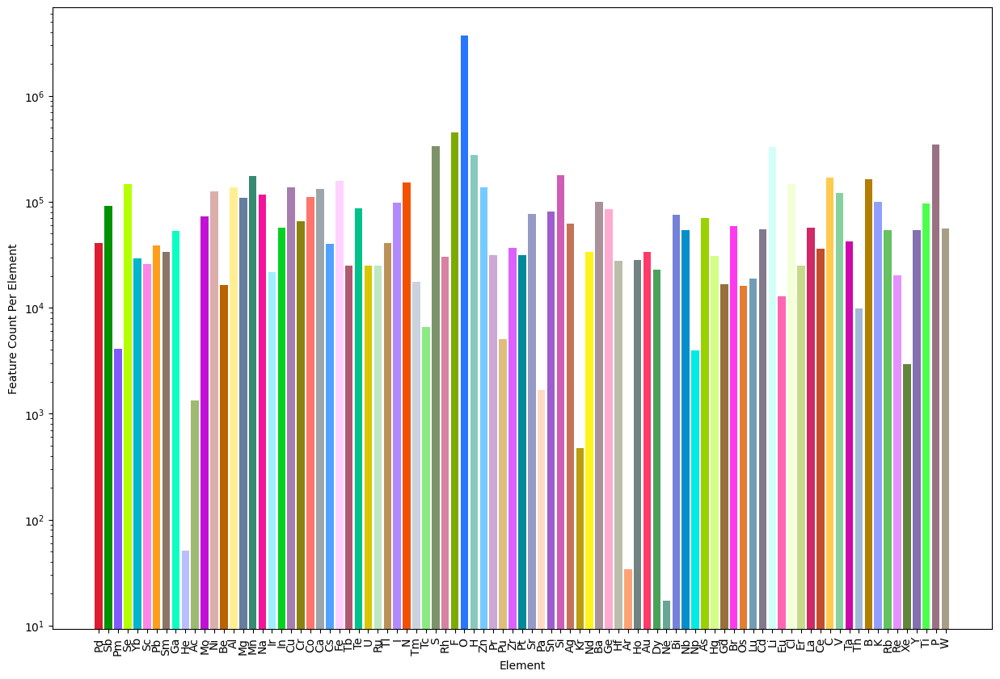

In [14]:
print(data_count)

plt.figure(figsize = (15,10))
plt.bar(range(len(data_count)), list(data_count.values()), color = colors, align='center',log = True)
plt.xticks(range(len(data_count)), list(data_count.keys()),rotation = 90)

plt.ylabel("Feature Count Per Element")
plt.xlabel("Element")

dict_keys(['Pd', 'Sb', 'Pm', 'Se', 'Yb', 'Sc', 'Pb', 'Sm', 'Ga', 'He', 'Ac', 'Mo', 'Ni', 'Be', 'Al', 'Mg', 'Mn', 'Na', 'Ir', 'In', 'Cu', 'Cr', 'Co', 'Ca', 'Cs', 'Fe', 'Tb', 'Te', 'U', 'Ru', 'Tl', 'I', 'N', 'Tm', 'Tc', 'S', 'Rh', 'F', 'O', 'H', 'Zn', 'Pr', 'Pu', 'Zr', 'Pt', 'Sr', 'Pa', 'Sn', 'Si', 'Ag', 'Kr', 'Nd', 'Ba', 'Ge', 'Hf', 'Ar', 'Ho', 'Au', 'Dy', 'Ne', 'Bi', 'Nb', 'Np', 'As', 'Hg', 'Gd', 'Br', 'Os', 'Lu', 'Cd', 'Li', 'Eu', 'Cl', 'Er', 'La', 'Ce', 'C', 'V', 'Ta', 'Th', 'B', 'K', 'Rb', 'Re', 'Xe', 'Y', 'Ti', 'P', 'W'])


Text(0.5, 0, 'Element')

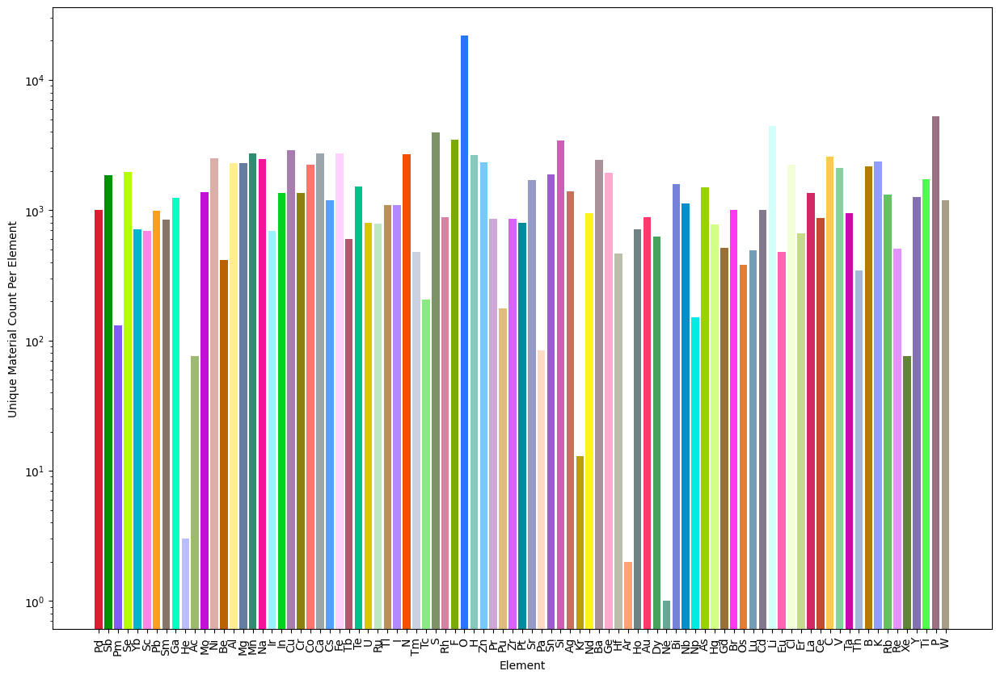

In [15]:
#plt.figure(figsize = (15,10))
#check for the same mp_id if there are two or more data that have the same site as well
#ask Deyu or Matt for if they have a better way to make sure all of these are a unit cell and not a supercell, notice that for oxygen, on average this means every molecule has 100 O's which is a lot
#do UMAP insted for 3d instead of 2d and ask CG to generate multiple 3d perspective plot and pick a good angle
#search m3gnegt paper, 2nd paper with livermore people, they implement some sampling for the stucture
#use earth mover's distance to compare feature vectors for each atom and cut out the ones too similar, but this may be very computationally costly

print(materials.keys())

unique_materials = {}

for key in materials.keys():
    if key == '__pycache__':
        continue
    unique_materials[key] = len(np.unique(materials[key]))

plt.figure(figsize = (15,10))
plt.bar(range(len(unique_materials)), list(unique_materials.values()), color = colors,align='center',log = True)
plt.xticks(range(len(unique_materials)), list(unique_materials.keys()),rotation = 90)
plt.ylabel("Unique Material Count Per Element")
plt.xlabel("Element")

Text(0.5, 0, 'Element')

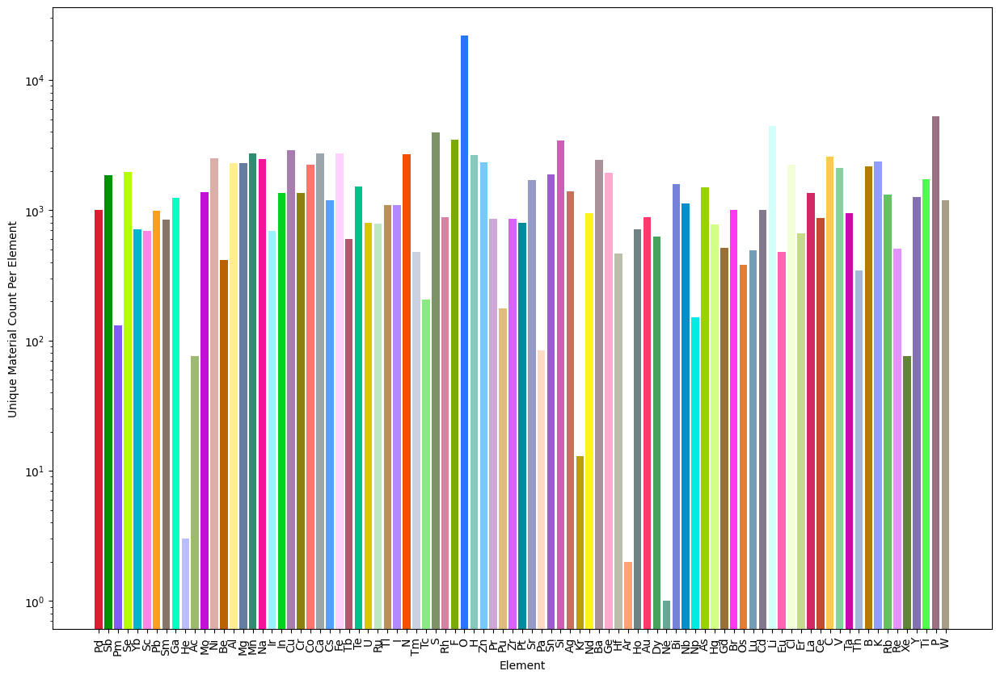

In [16]:
unique_materials = {}

for key in materials.keys():
    if key == '__pycache__':
        continue
    unique_materials[key] = len(np.unique(materials[key]))

plt.figure(figsize = (15,10))
plt.bar(range(len(unique_materials)), list(unique_materials.values()), color = colors,align='center',log = True)
plt.xticks(range(len(unique_materials)), list(unique_materials.keys()),rotation = 90)
plt.ylabel("Unique Material Count Per Element")
plt.xlabel("Element")

# UMAP Plots

In [40]:
np.random.seed(208374823)

idx = np.random.choice(range(len(features)),200000)
subset = np.array(features)[idx]
reducer = umap.UMAP(random_state=12934, n_neighbors = 25,verbose = True, n_jobs = 6).fit(subset)#,n_neighbors=, min_dist=)
embedding = reducer.transform(subset)

#actually, separate fit and embedding function and save reducer to a pkl file
#randomly downsample dataset to make things faster, since random sampling preserves the UMAP structure
#when you do random sample, pick same number of randomly selected elements for each element

/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


UMAP(n_jobs=1, n_neighbors=25, random_state=12934, verbose=True)
Fri Aug  9 11:42:38 2024 Construct fuzzy simplicial set
Fri Aug  9 11:42:38 2024 Finding Nearest Neighbors
Fri Aug  9 11:42:38 2024 Building RP forest with 27 trees
Fri Aug  9 11:42:41 2024 NN descent for 18 iterations
	 1  /  18
	 2  /  18
	Stopping threshold met -- exiting after 2 iterations
Fri Aug  9 11:42:58 2024 Finished Nearest Neighbor Search
Fri Aug  9 11:43:00 2024 Construct embedding


/Library/Frameworks/Python.framework/Versions/3.12/lib/python3.12/site-packages/sklearn/manifold/_spectral_embedding.py:329: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Aug  9 11:45:35 2024 Finished embedding


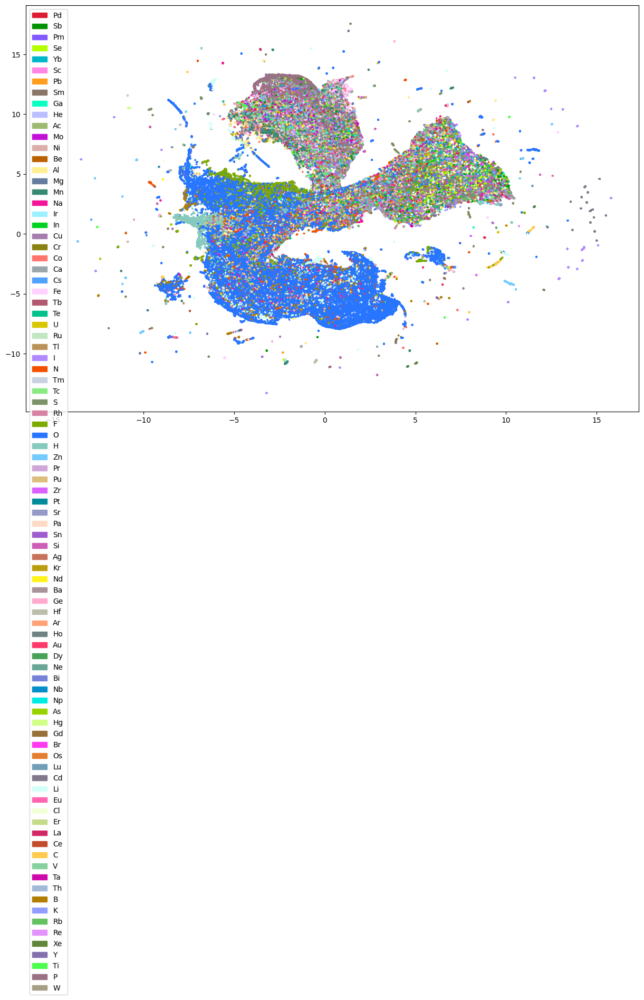

In [41]:
#color instead by columns of periodic table instead of individual elements
#color by rows as well and see what happens
#add structure into the dictionary for the elemental feature files

#for Oxygen, you could downsample based on similarity of feature
#transfer data onto computing cluster

# create the new map

fig, ax = plt.subplots(figsize = (15,10))

x = embedding[:, 0]
y = embedding[:, 1]

scatter = ax.scatter(x, y, c=np.array(colormap)[idx], s=3)

import matplotlib.patches as mpatches

handles = []
for i in range(len(colors)):
    patch = mpatches.Patch(color=colors[i], label=elemental_files[i])
    handles.append(patch)

plt.legend(handles=handles)


In [42]:
filesave = {'features': features, 'elemental_files': elemental_files, 'element_indices': elements, 'UMAP_embedding': embedding}

In [43]:
with open('embedding.pkl', 'wb') as f:  # open a text file
    pickle.dump(embedding, f) # serialize the list


In [44]:
el_subset = np.array(elements)[idx]
color_subset = np.array(colormap)[idx]

## Full Plots Colored Differently

612815


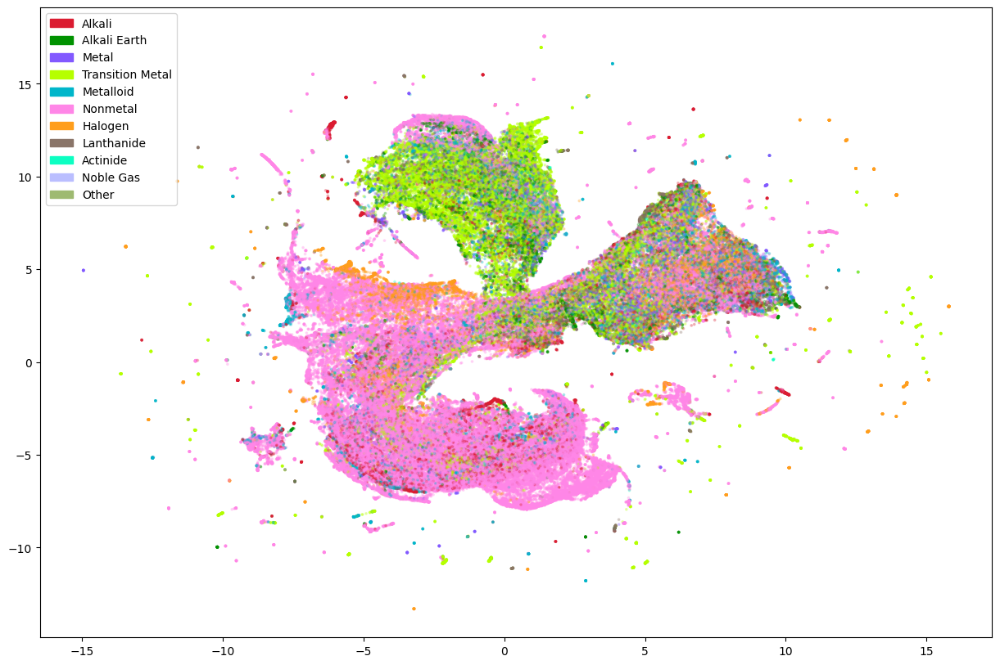

In [53]:
sections = {}
sections['Alkali'] = ['Li','Na','K','Rb','Cs','Fr']
sections['Alkali Earth'] = ['Be','Mg','Ca','Sr','Ba','Ra']
sections['Metal'] = ['Al','Ga','In','Sn','Tl','Pb','Bi','Fl','Lv']
sections['Transition Metal'] = ['Sc','Ti','V','Cr','Mn','Fe','Co','Ni','Cu',
                                'Zn','Y','Zr','Nb','Mo','Tc','Ru','Rh','Pd',
                                'Ag','Cd','Hf','Ta','W','Re','Os','Ir','Pt',
                                'Au','Hg','Rf','Db','Sg','Bh','Hs','Mt','Ds',
                                'Rg','Cn']
sections['Metalloid'] = ['B','Si','Ge','As','Sb','Te','Po']
sections['Nonmetal'] = ['C','N','O','P','S','Se','H']
sections['Halogen'] = ['F','Cl','Br','I','At']
sections['Lanthanide'] = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy',
                          'Ho','Er','Tm','Yb','Lu']
sections['Actinide'] = ['Ac','Th','Pa','U','Np','Pu','Am','Cm','Bk','Cf','Es','Fm','Md','No','Lr']
sections['Noble Gas'] = ['He','Ne','Ar','Kr','Xe','Rn']
sections['Other'] = ['Nh','Og','Ts','Mc']

color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 0.25, size = 3)

612815


/Users/ninacao/Library/Python/3.12/lib/python/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


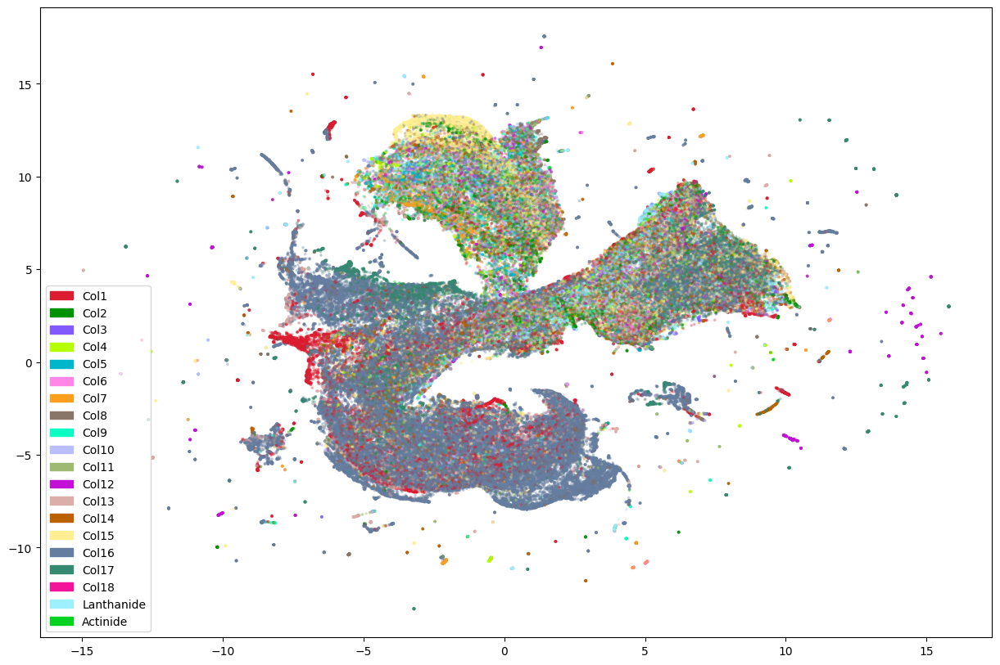

In [54]:
sections = {}
sections['Col1'] = ['H','Li','Na','K','Rb','Cs','Fr']
sections['Col2'] = ['Be','Mg','Ca','Sr','Ba','Ra']
sections['Col3'] = ['Sc','Y']
sections['Col4'] = ['Ti','Zr','Hf','Rf']
sections['Col5'] = ['V','Nb','Ta','Db']
sections['Col6'] = ['Cr','Mo','W','Sg']
sections['Col7'] = ['Mn','Tc','Re','Bh']
sections['Col8'] = ['Fe','Ru','Os','Hs']
sections['Col9'] = ['Co','Rh','Ir','Mt']
sections['Col10'] = ['Ni','Pd','Pt','Ds']
sections['Col11'] = ['Cu','Ag','Au','Rg']
sections['Col12'] = ['Zn','Cd','Hg','Cn']
sections['Col13'] = ['B','Al','Ga','In','Tl','Nh']
sections['Col14'] = ['C','Si','Ge','Sn','Pb','Fl']
sections['Col15'] = ['N','P','As','Sb','Bi','Mc']
sections['Col16'] = ['O','S','Se','Te','Po','Lv']
sections['Col17'] = ['F','Cl','Br','I','At','Ts']
sections['Col18'] = ['He','Ne','Ar','Kr','Xe','Rn','Og']
sections['Lanthanide'] = ['La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy',
                          'Ho','Er','Tm','Yb','Lu']
sections['Actinide'] = ['Ac','Th','Pa','U','Np','Pu','Am','Cm','Bk','Cf','Es','Fm','Md','No','Lr']

color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 0.25, size = 3)

612815


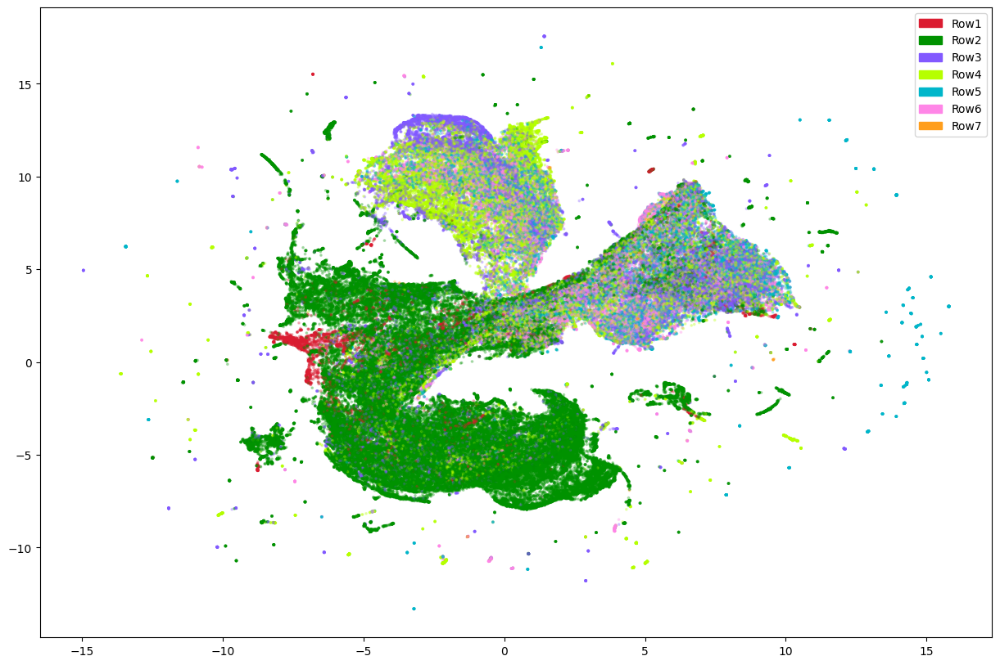

In [56]:
sections = {}
sections['Row1'] = ['H','He']
sections['Row2'] = ['Li','Be','B','C','N','O','F','Ne']
sections['Row3'] = ['Na','Mg','Al','Si','P','S','Cl','Ar']
sections['Row4'] = ['K','Ca','Sc','Ti','V','Cr','Mn','Fe','Co','Ni','Cu','Zn','Ga','Ge','As','Se','Br','Kr']
sections['Row5'] = ['Rb','Sr','Y','Zr','Nb','Mo','Tc','Ru','Rh','Pd','Ag','Cd','In','Sn','Sb','Te','I','Xe']
sections['Row6'] = ['Cs','Ba','La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu','Hf',
                    'Ta','W','Re','Os','Ir','Pt','Au','Hg','Tl','Pb','Bi','Po','At','Rn']
sections['Row7'] = ['Fr','Ra','Ac','Th','Pa','U','Np','Pu','Am','Cm','Bk','Cf','Es','Fm','Md','No','Lr','Rf',
                    'Db','Sg','Bh','Hs','Mt','Ds','Rg','Cn','Nh','Fl','Mc','Lv','Ts','Og']

color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 0.25, size = 3)

612815


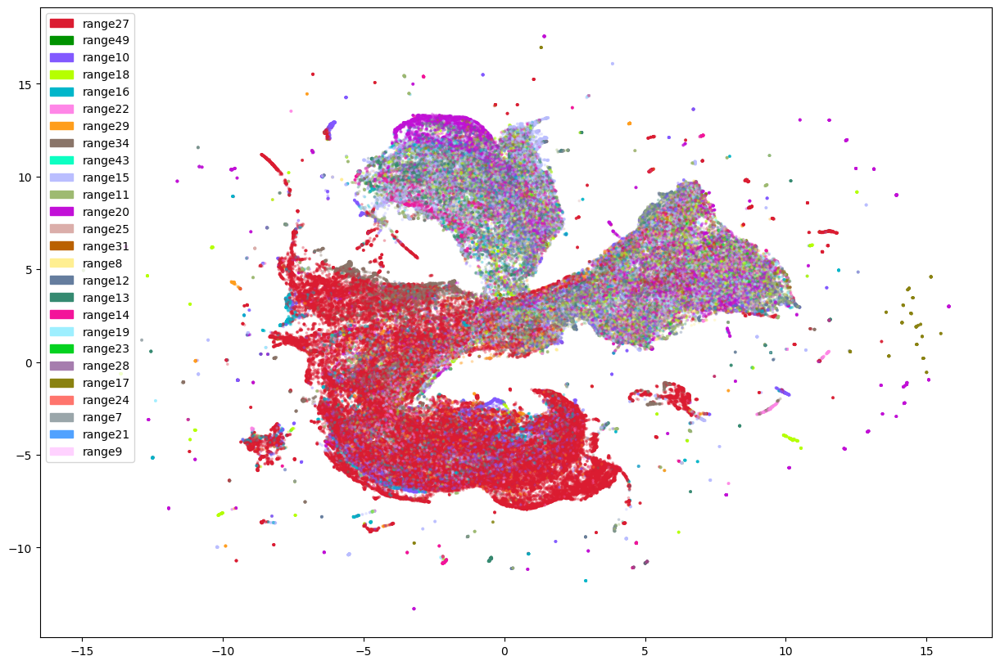

In [55]:
sections = {
    'range27': ['H', 'O'],
    'range49': ['He'],
    'range10': ['Li', 'Na', 'Ba', 'Pr', 'Lu', 'Ra', 'Ac'],
    'range18': ['Be', 'Zn', 'Te', 'Ir', 'Pt', 'Au'],
    'range16': ['B', 'Si', 'Pd', 'Po'],
    'range22': ['C'],
    'range29': ['N'],
    'range34': ['F'],
    'range43': ['Ne'],
    'range15': ['Mg', 'Fe', 'Co', 'Ni', 'Cu', 'Ge', 'Ag', 'Ta', 'W', 'Re', 'Mt', 'Ds', 'Og'],
    'range11': ['Al', 'Sr', 'In', 'La', 'Ce', 'Nd', 'Pm', 'Sm', 'Eu', 'Tb', 'Dy', 'Pa', 'Am', 'Db'],
    'range20': ['P', 'S', 'I', 'Hg'],
    'range25': ['Cl'],
    'range31': ['Ar'],
    'range8': ['K', 'Rb'],
    'range12': ['Ca', 'Ga', 'Y', 'Gd', 'Ho', 'Er', 'Tm', 'Yb', 'Tl', 'Th', 'U', 'Np', 'Pu', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Rf', 'Rg'],
    'range13': ['Sc', 'Ti', 'V', 'Cr', 'Zr', 'Nb', 'Hf', 'Md', 'No', 'Sg', 'Bh'],
    'range14': ['Mn', 'Mo', 'Tc', 'Ru', 'Rh', 'Sn', 'Pb', 'Bi', 'Hs', 'Nh', 'Fl', 'Mc', 'Lv', 'Ts'],
    'range19': ['As', 'Se', 'At'],
    'range23': ['Br', 'Cn'],
    'range28': ['Kr'],
    'range17': ['Cd', 'Sb', 'Os'],
    'range24': ['Xe'],
    'range7': ['Cs', 'Fr'],
    'range21': ['Rn'],
    'range9': ['Lr']
}

color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 0.25, size = 3)

612815


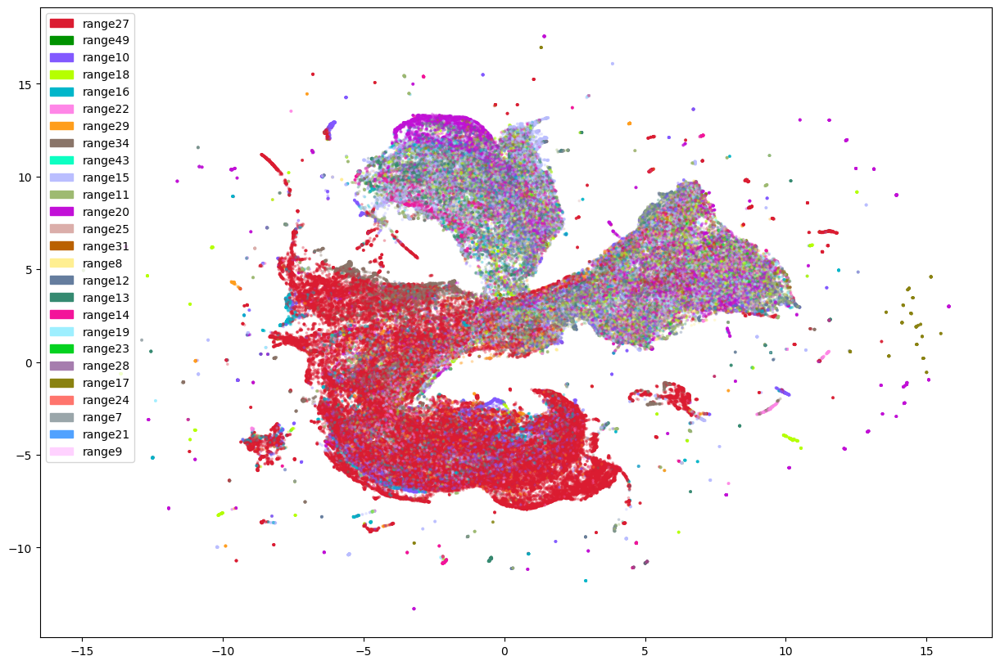

In [58]:
sections = {
    'range27': ['H', 'O'],
    'range49': ['He'],
    'range10': ['Li', 'Na', 'Ba', 'Pr', 'Lu', 'Ra', 'Ac'],
    'range18': ['Be', 'Zn', 'Te', 'Ir', 'Pt', 'Au'],
    'range16': ['B', 'Si', 'Pd', 'Po'],
    'range22': ['C'],
    'range29': ['N'],
    'range34': ['F'],
    'range43': ['Ne'],
    'range15': ['Mg', 'Fe', 'Co', 'Ni', 'Cu', 'Ge', 'Ag', 'Ta', 'W', 'Re', 'Mt', 'Ds', 'Og'],
    'range11': ['Al', 'Sr', 'In', 'La', 'Ce', 'Nd', 'Pm', 'Sm', 'Eu', 'Tb', 'Dy', 'Pa', 'Am', 'Db'],
    'range20': ['P', 'S', 'I', 'Hg'],
    'range25': ['Cl'],
    'range31': ['Ar'],
    'range8': ['K', 'Rb'],
    'range12': ['Ca', 'Ga', 'Y', 'Gd', 'Ho', 'Er', 'Tm', 'Yb', 'Tl', 'Th', 'U', 'Np', 'Pu', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Rf', 'Rg'],
    'range13': ['Sc', 'Ti', 'V', 'Cr', 'Zr', 'Nb', 'Hf', 'Md', 'No', 'Sg', 'Bh'],
    'range14': ['Mn', 'Mo', 'Tc', 'Ru', 'Rh', 'Sn', 'Pb', 'Bi', 'Hs', 'Nh', 'Fl', 'Mc', 'Lv', 'Ts'],
    'range19': ['As', 'Se', 'At'],
    'range23': ['Br', 'Cn'],
    'range28': ['Kr'],
    'range17': ['Cd', 'Sb', 'Os'],
    'range24': ['Xe'],
    'range7': ['Cs', 'Fr'],
    'range21': ['Rn'],
    'range9': ['Lr']
}

color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 0.25, size = 3)

612815


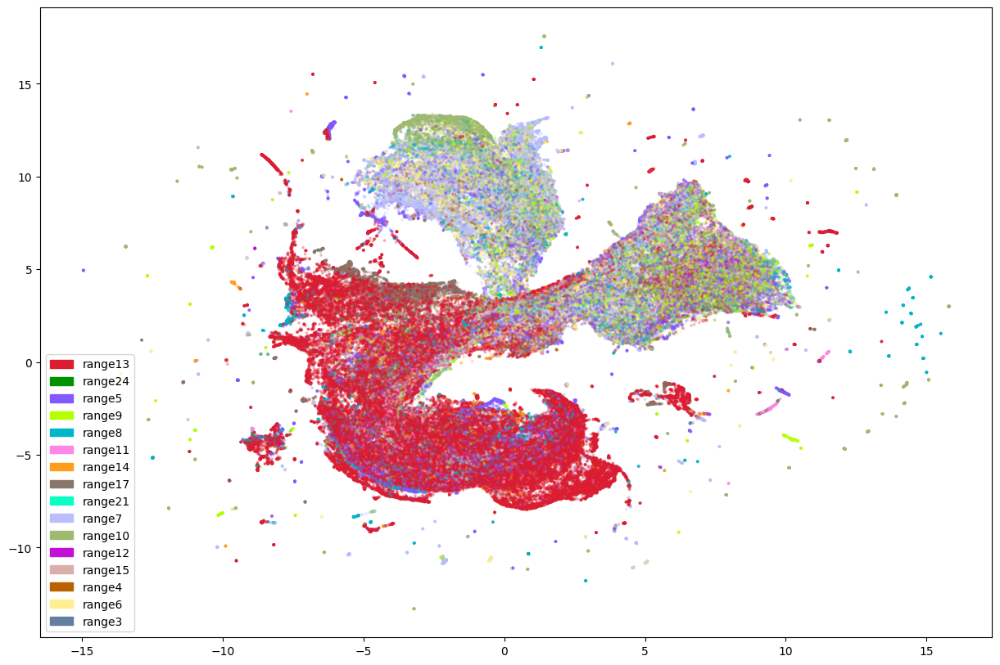

In [57]:
sections = {
    'range13': ['H', 'O'],
    'range24': ['He'],
    'range5': ['Li', 'Na', 'Al', 'Sr', 'In', 'Ba', 'La', 'Ce', 'Pr', 'Nd', 'Pm', 'Sm', 'Eu', 'Tb', 'Dy', 'Lu', 'Ra', 'Ac', 'Pa', 'Am', 'Db'],
    'range9': ['Be', 'Zn', 'As', 'Se', 'Te', 'Ir', 'Pt', 'Au', 'At'],
    'range8': ['B', 'Si', 'Pd', 'Cd', 'Sb', 'Os', 'Po'],
    'range11': ['C', 'Br', 'Cn'],
    'range14': ['N', 'Kr'],
    'range17': ['F'],
    'range21': ['Ne'],
    'range7': ['Mg', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Ge', 'Mo', 'Tc', 'Ru', 'Rh', 'Ag', 'Sn', 'Ta', 'W', 'Re', 'Pb', 'Bi', 'Hs', 'Mt', 'Ds', 'Nh', 'Fl', 'Mc', 'Lv', 'Ts', 'Og'],
    'range10': ['P', 'S', 'I', 'Hg', 'Rn'],
    'range12': ['Cl', 'Xe'],
    'range15': ['Ar'],
    'range4': ['K', 'Rb', 'Lr'],
    'range6': ['Ca', 'Sc', 'Ti', 'V', 'Cr', 'Ga', 'Y', 'Zr', 'Nb', 'Gd', 'Ho', 'Er', 'Tm', 'Yb', 'Hf', 'Tl', 'Th', 'U', 'Np', 'Pu', 'Cm', 'Bk', 'Cf', 'Es', 'Fm', 'Md', 'No', 'Rf', 'Sg', 'Bh', 'Rg'],
    'range3': ['Cs', 'Fr']
}

color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 0.25, size = 3)

612815


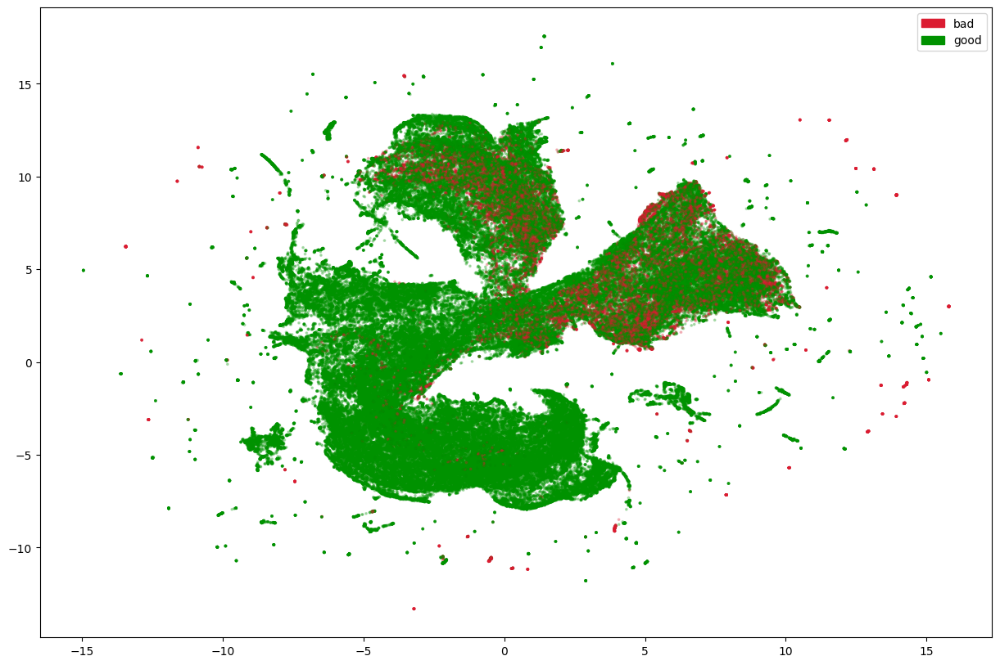

In [59]:
sections = {
    "bad": [
        "Yb", "Xe", "U", "Tm", "Tl", "Th", "Te", "W", "Tb", "Ta",
        "Sm", "Re", "Pu", "Pt", "Pr", "Pm", "Pb", "Pa",
        "Os", "Np", "Ne", "Nd", "Lu", "La", "Kr", "Ir", "I", "Ho", "Hg", "Hf",
        "He", "Gd", "Eu", "Er", "Dy", "Cs", "Ce", "Bi", "Ba", "Au", "Ac"],
    "good": [
        "H", "Li", "Be", "B", "C", "N", "O", "F", "Na", "Mg",
        "Al", "Si", "P", "S", "Cl", "Ar", "K", "Ca", "Sc", "Ti",
        "V", "Cr", "Mn", "Fe", "Co", "Ni", "Cu", "Zn", "Ga", "Ge",
        "As", "Se", "Br", "Rb", "Sr", "Y", "Zr", "Nb", "Mo", "Tc",
        "Ru", "Rh", "Pd", "Ag", "Cd", "In", "Sn", "Sb", "At", "Rn",
        "Fr", "Ra", "Rf", "Db", "Sg", "Bh", "Hs", "Mt", "Ds", "Rg",
        "Cn", "Nh", "Fl", "Mc", "Lv", "Ts", "Og"
        ]
}

color_full_UMAP(sections, embedding,elemental_files, elements, lightness_bounds = (40,100), alpha = 0.25, size = 3)

## Periodic Section Plots

### Not Retransformed

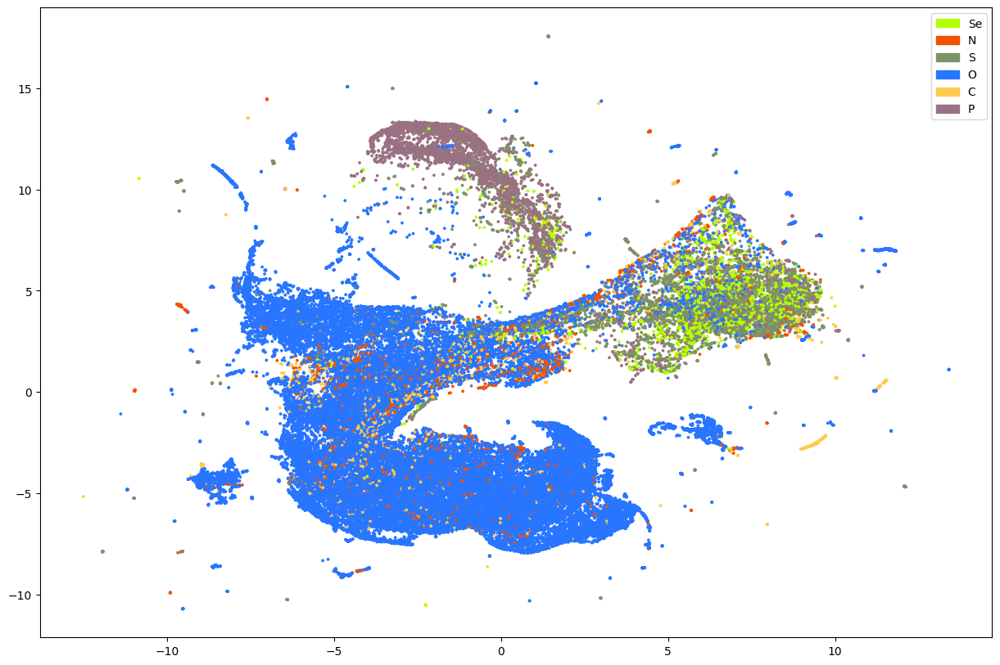

In [100]:
reactive_nonmetals = ["C","N","O","P","S","Se"]

make_elemental_plot(reactive_nonmetals, embedding, colors, color_subset, el_subset, elemental_files)

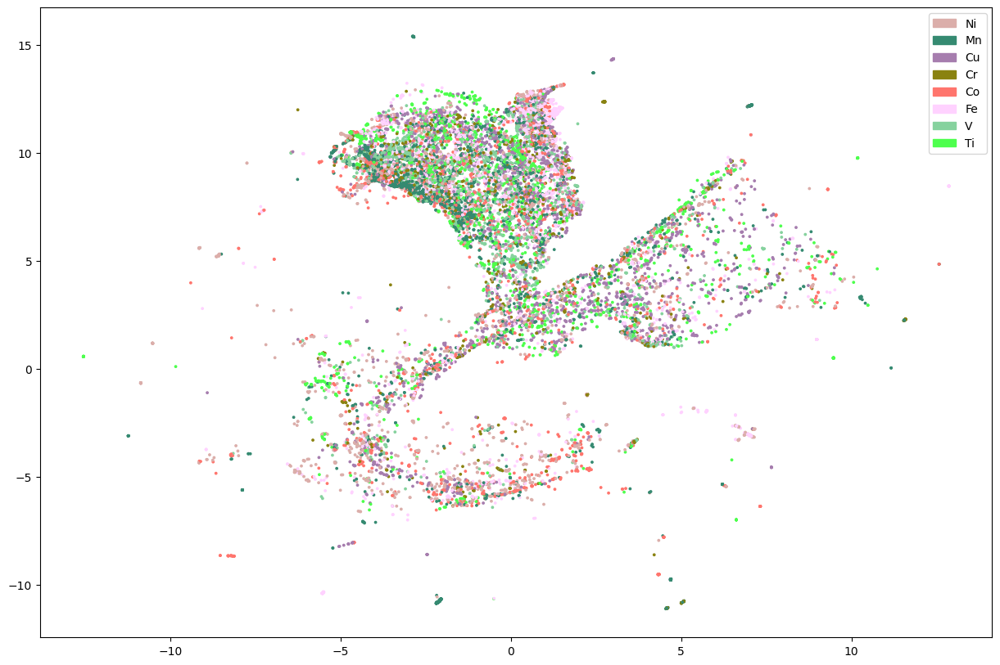

In [104]:
transition_metals_3d = ["Ti","V","Cr","Fe","Mn","Co","Ni","Cu"]

make_elemental_plot(transition_metals_3d, embedding, colors, color_subset, el_subset, elemental_files)

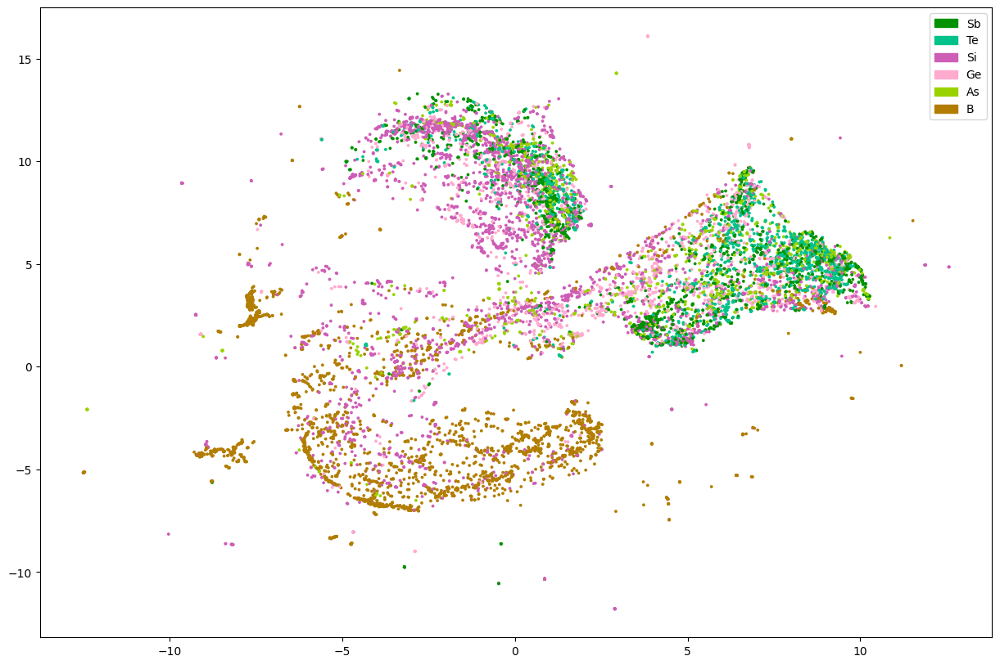

In [102]:
metalloids = ["B","Si","Ge","As","Sb","Te","Po"]

make_elemental_plot(metalloids, embedding, colors, color_subset, el_subset, elemental_files)

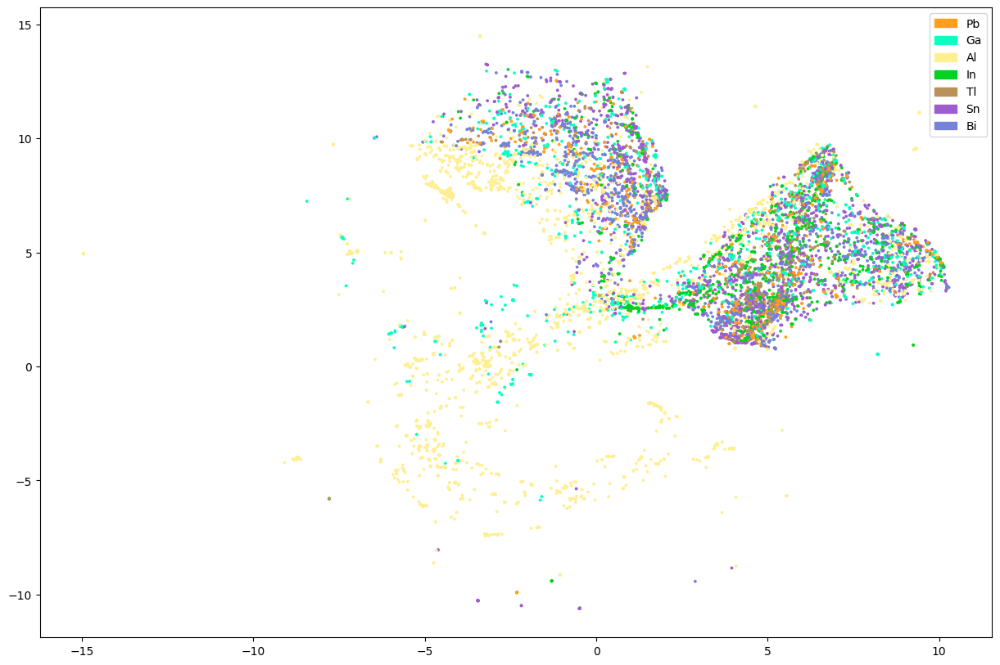

In [103]:
other_metals = ['Al','Ga','In','Sn','Tl','Pb','Bi','Nh','Fl','Mc','Lv']

make_elemental_plot(other_metals, embedding, colors, color_subset, el_subset, elemental_files)

### Retransformed

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


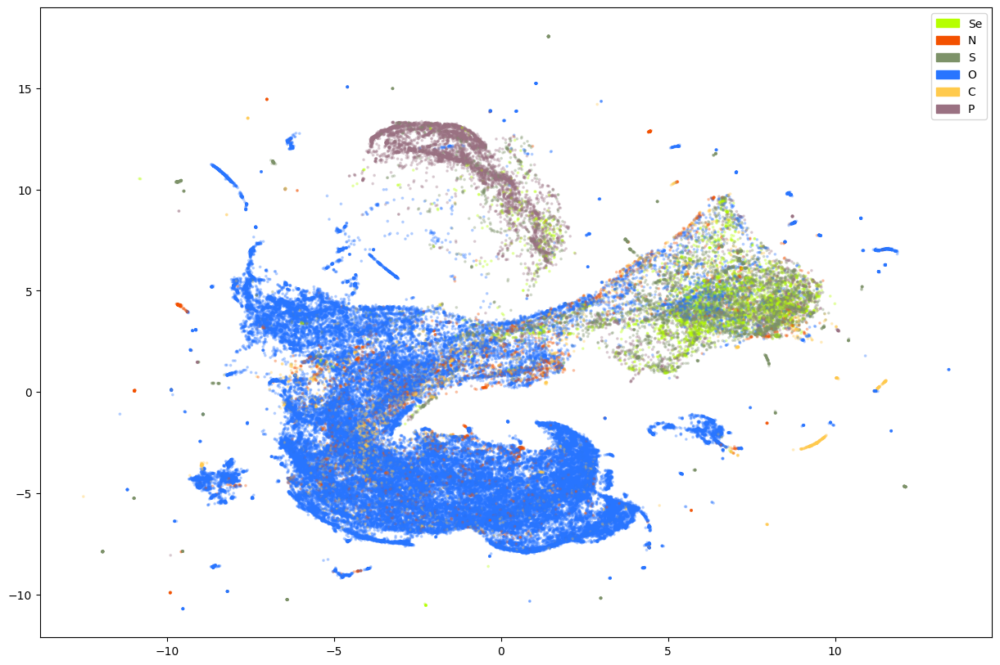

In [128]:
analyze_subsection(reactive_nonmetals, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)


Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


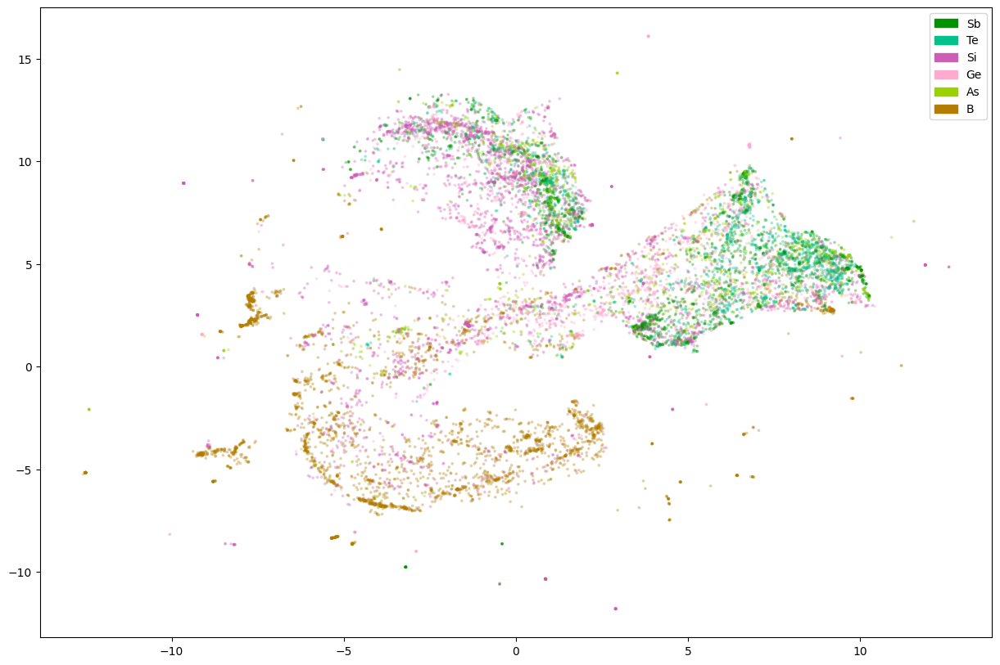

In [129]:
analyze_subsection(metalloids, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/100 [00:00]

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


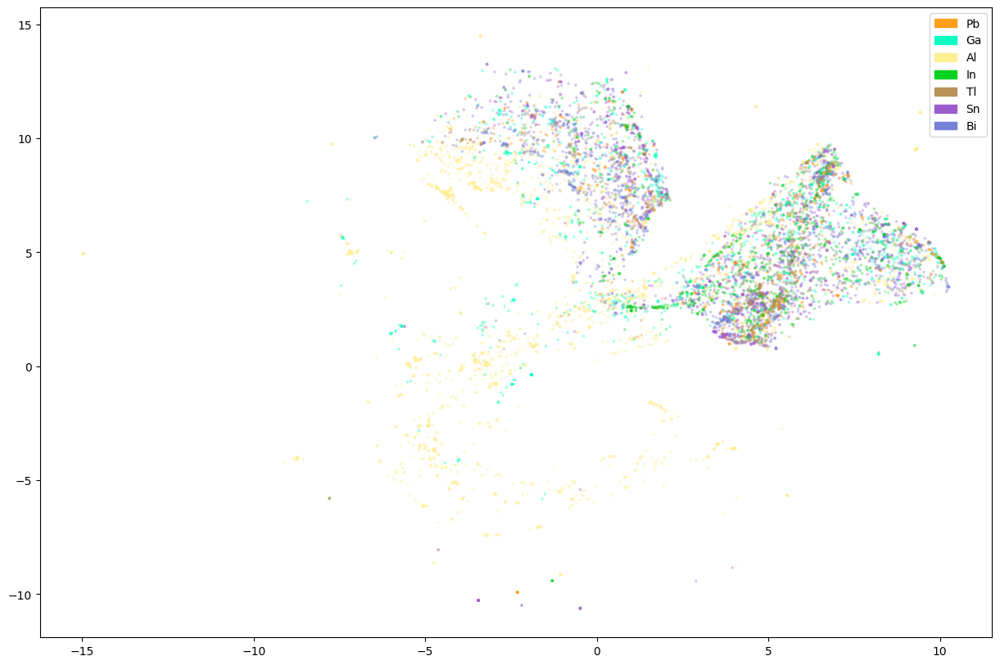

In [130]:
analyze_subsection(other_metals, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


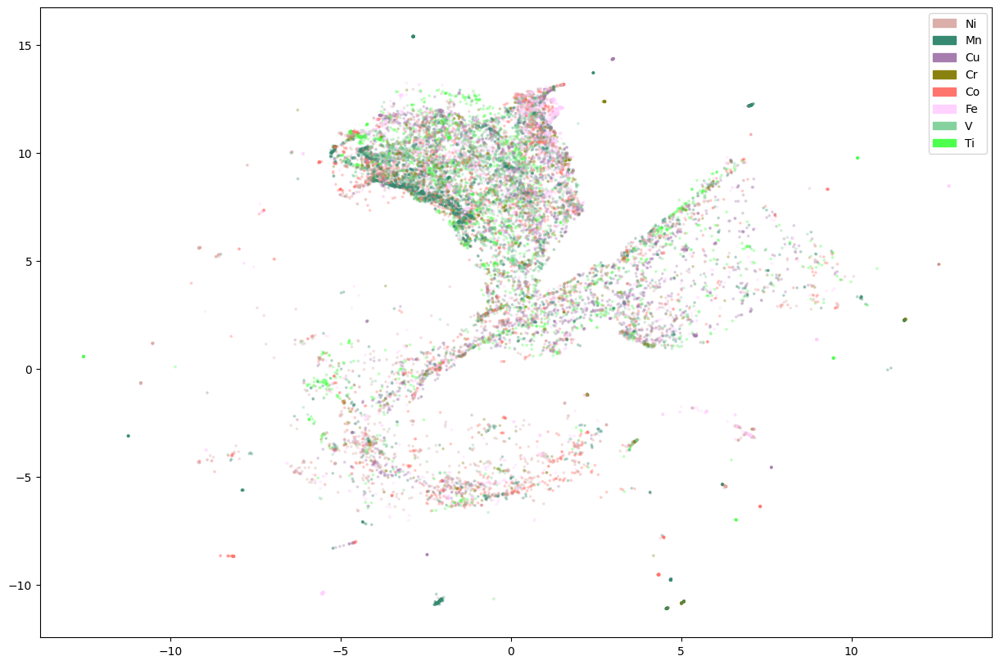

In [131]:
analyze_subsection(transition_metals_3d, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

## Column Plots

### Not Retransformed

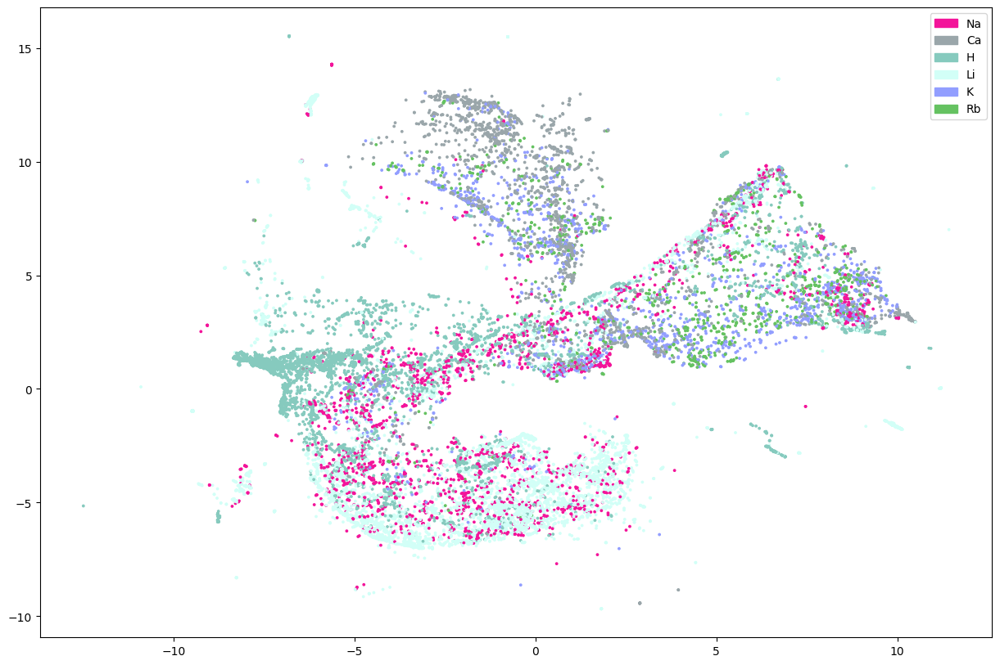

In [105]:
first_col = ["H","Li","Na","K","Rb","Ca","Fr"]

make_elemental_plot(first_col, embedding, colors, color_subset, el_subset, elemental_files)

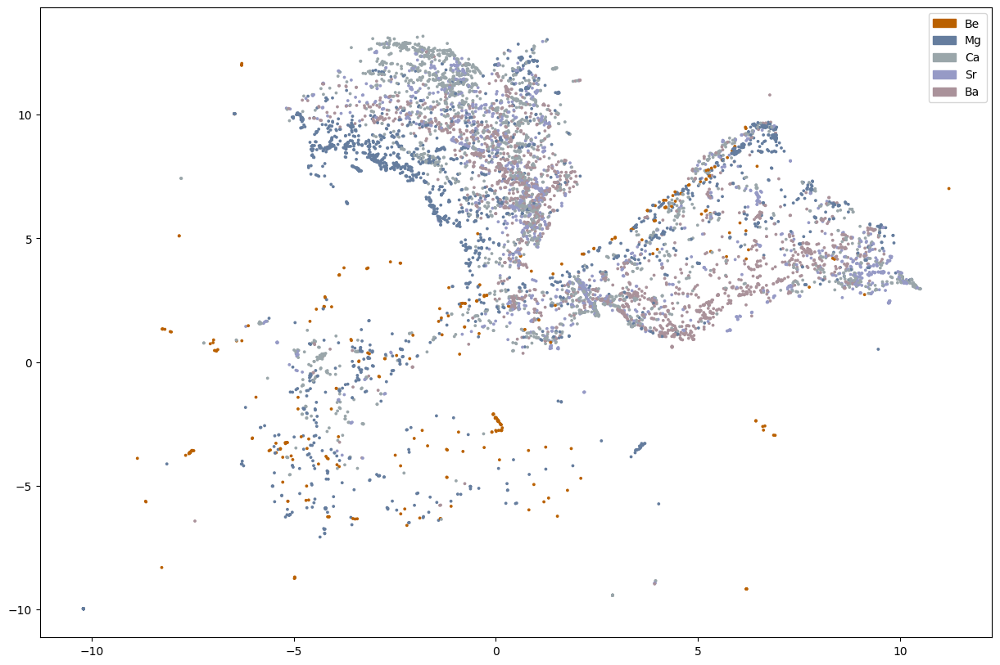

In [106]:
second_col = ["Be","Mg","Ca","Sr","Ba","Ra"]

make_elemental_plot(second_col, embedding, colors, color_subset, el_subset, elemental_files)

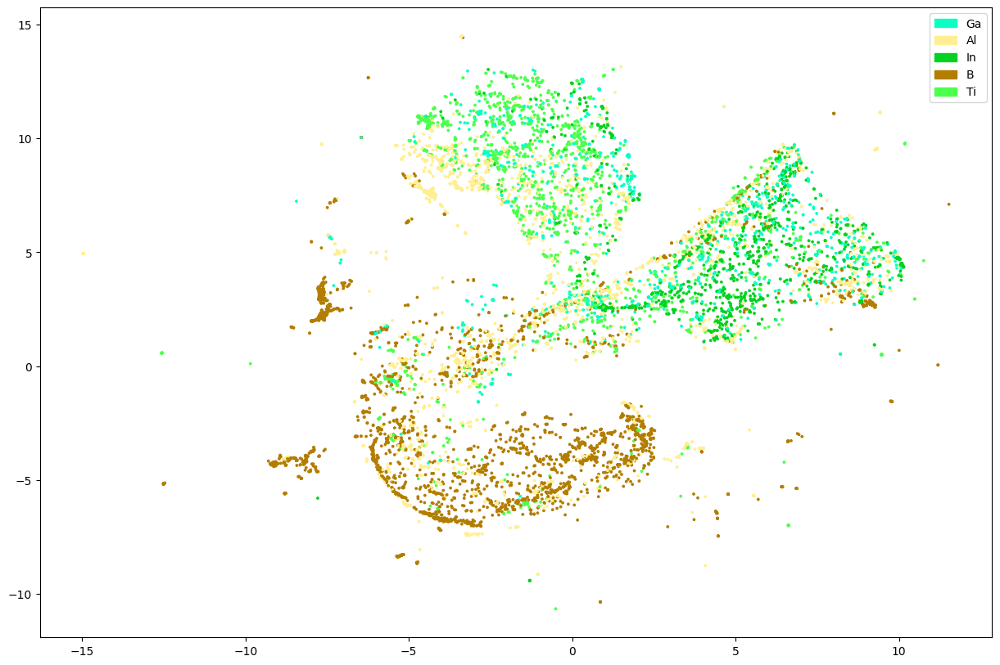

In [109]:
third_col = ["B","Al","Ga","In","Ti","Nh"]

make_elemental_plot(third_col, embedding, colors, color_subset, el_subset, elemental_files)

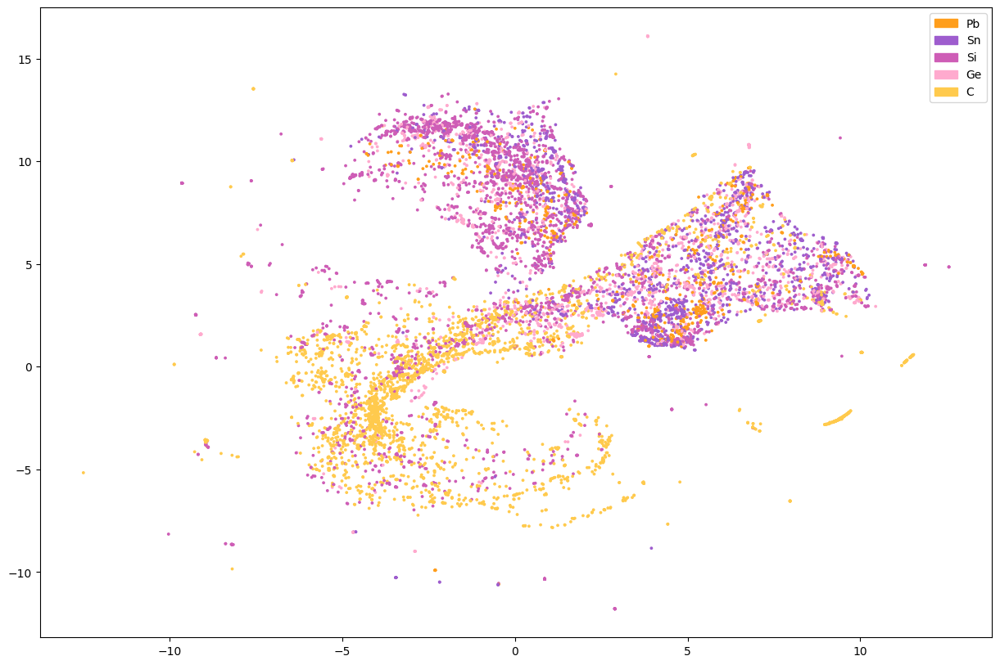

In [110]:
fourth_col = ["C","Si","Ge","Sn","Pb","Fl"]

make_elemental_plot(fourth_col, embedding, colors, color_subset, el_subset, elemental_files)

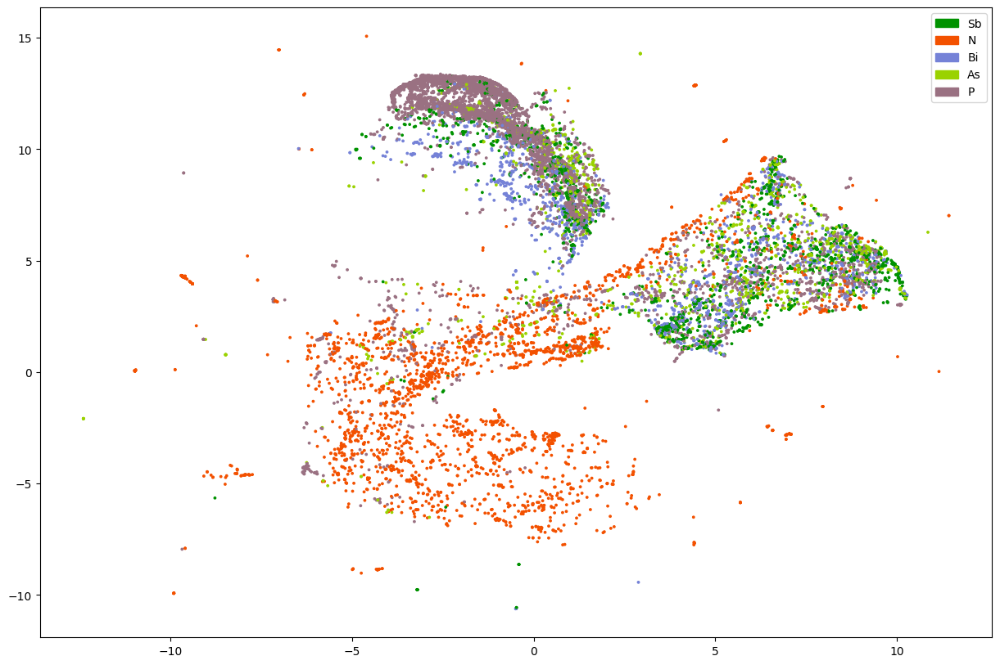

In [111]:
fifth_col = ["N","P","As","Sb","Bi","Mc"]

make_elemental_plot(fifth_col, embedding, colors, color_subset, el_subset, elemental_files)

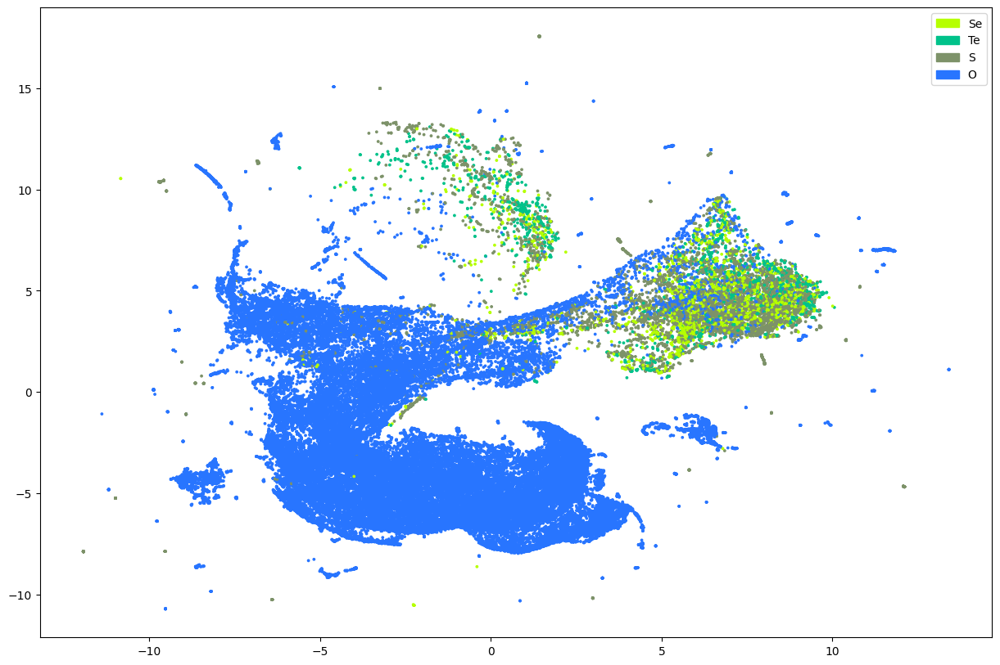

In [112]:
sixth_col = ["O","S","Se","Te","Po","Lv"]

make_elemental_plot(sixth_col, embedding, colors, color_subset, el_subset, elemental_files)

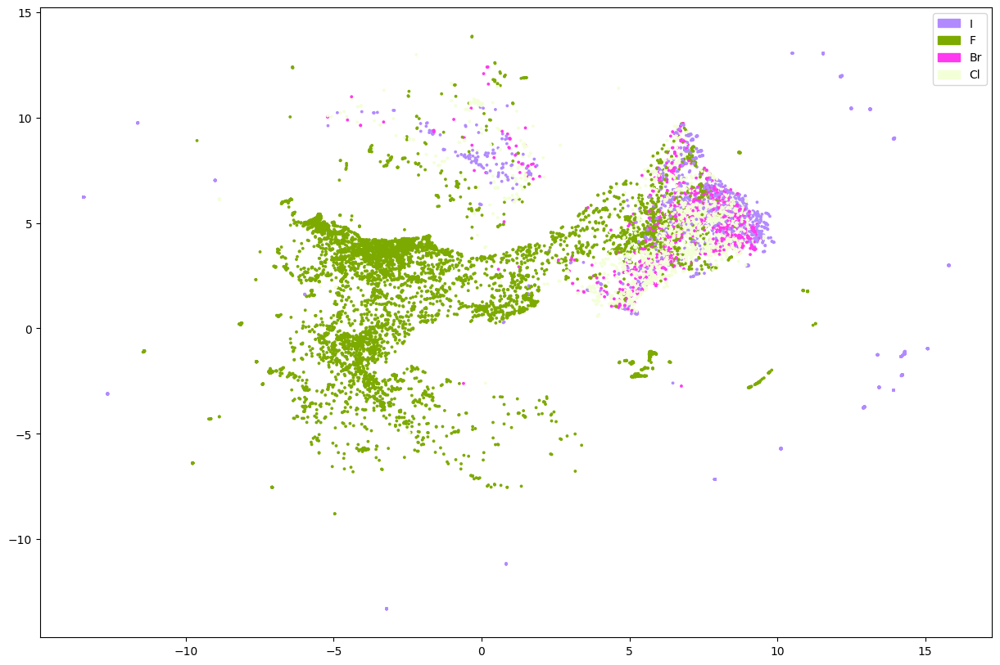

In [113]:
seventh_col = ["F","Cl","Br","I","At","Ts"]

make_elemental_plot(seventh_col, embedding, colors, color_subset, el_subset, elemental_files)

### Retransformed

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


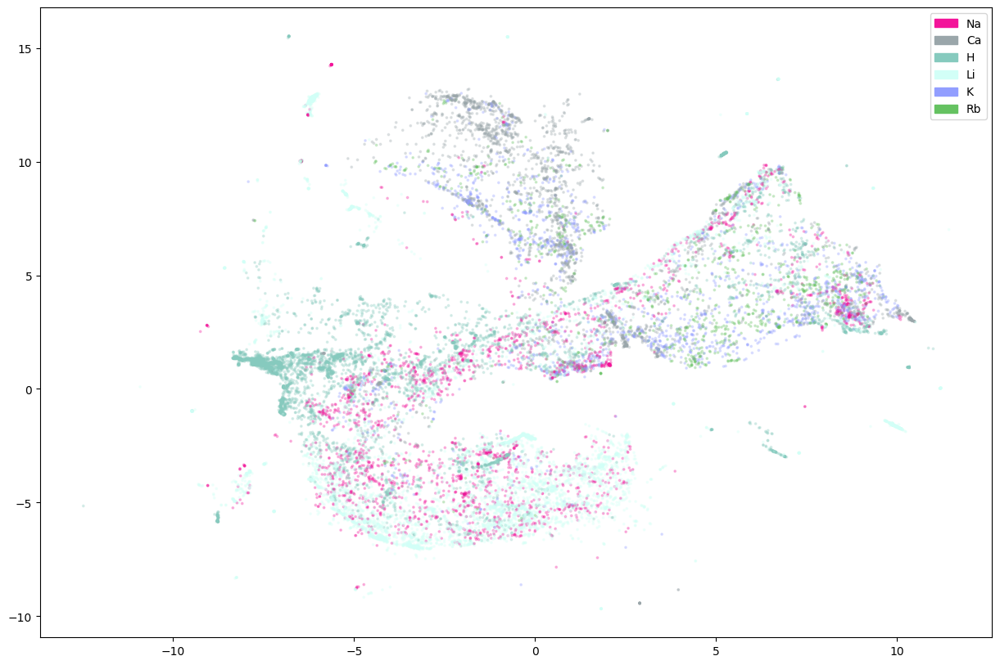

In [132]:
analyze_subsection(first_col, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/100 [00:00]

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


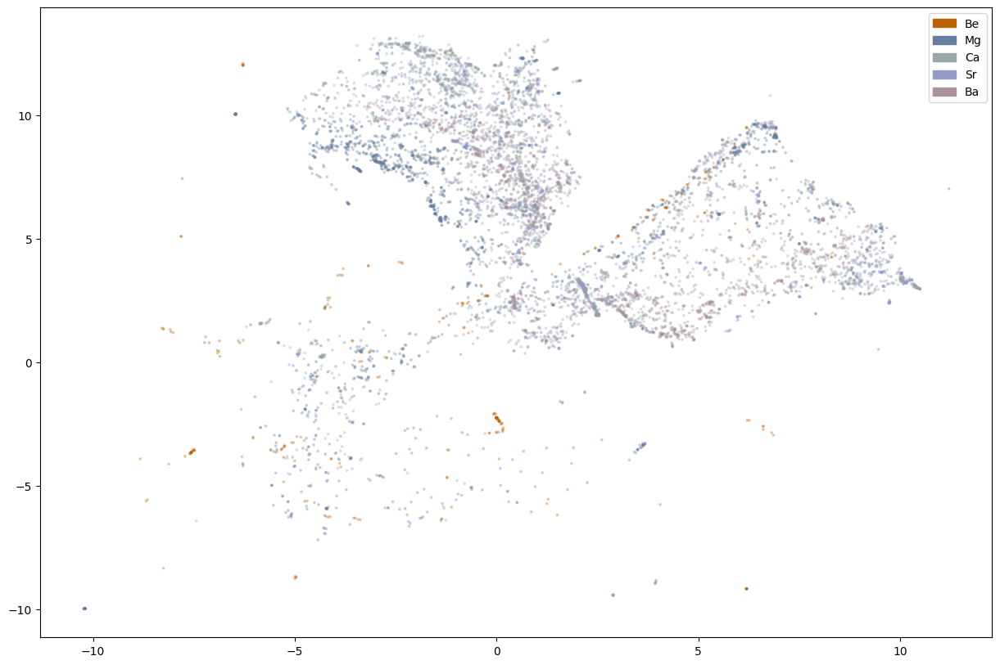

In [133]:
analyze_subsection(second_col, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/100 [00:00]

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


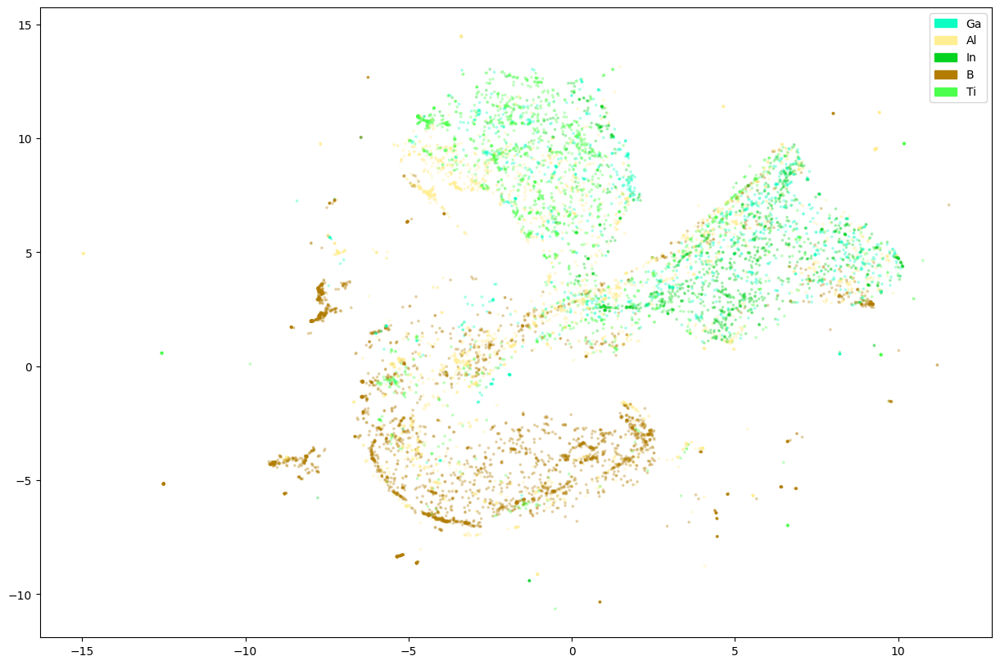

In [134]:
analyze_subsection(third_col, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


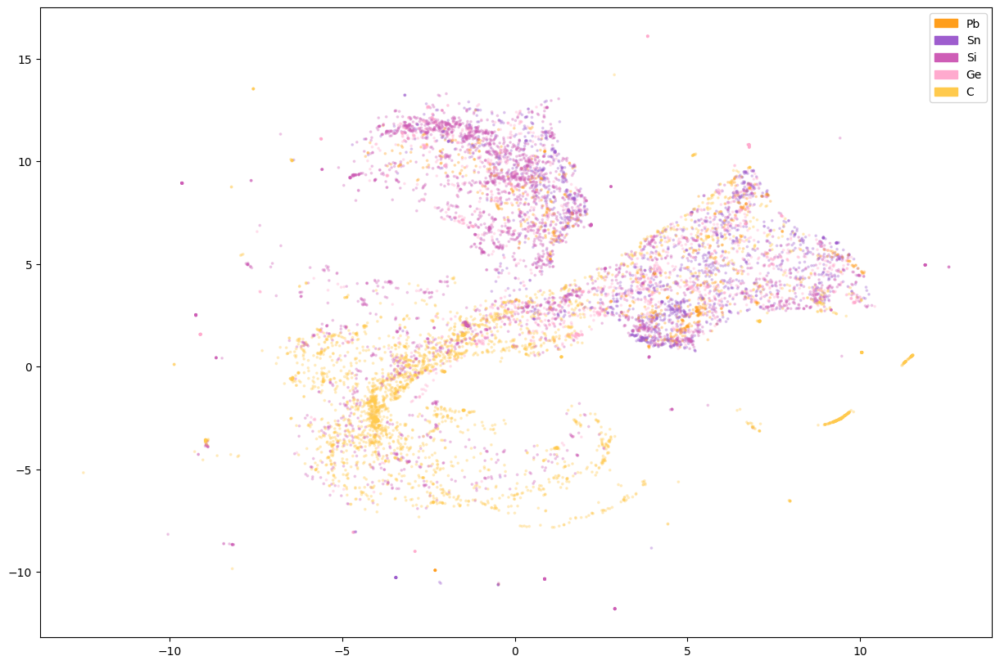

In [135]:
analyze_subsection(fourth_col, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


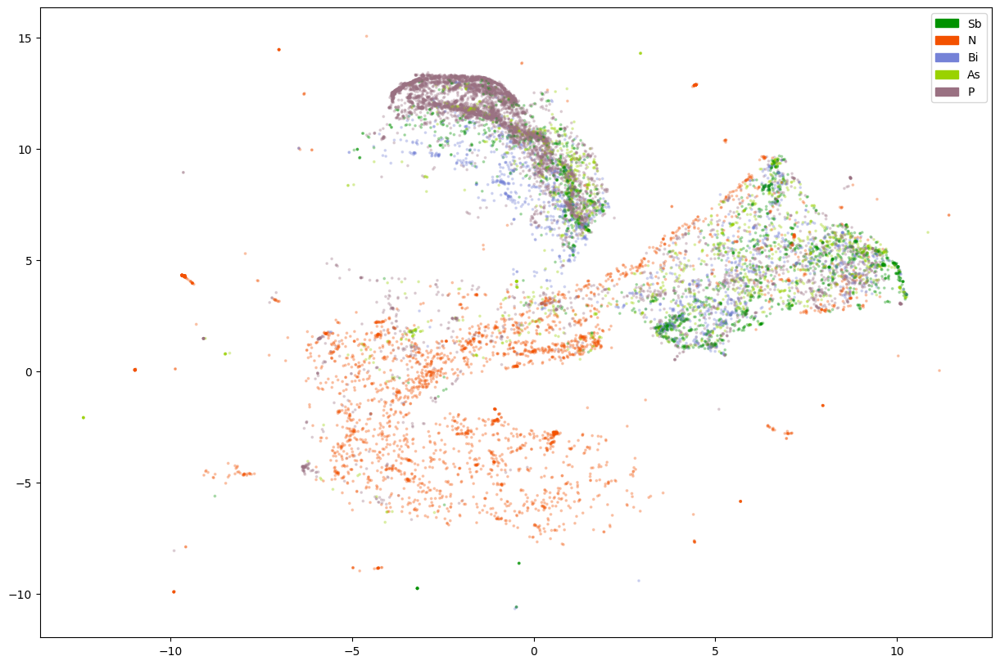

In [136]:
analyze_subsection(fifth_col, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


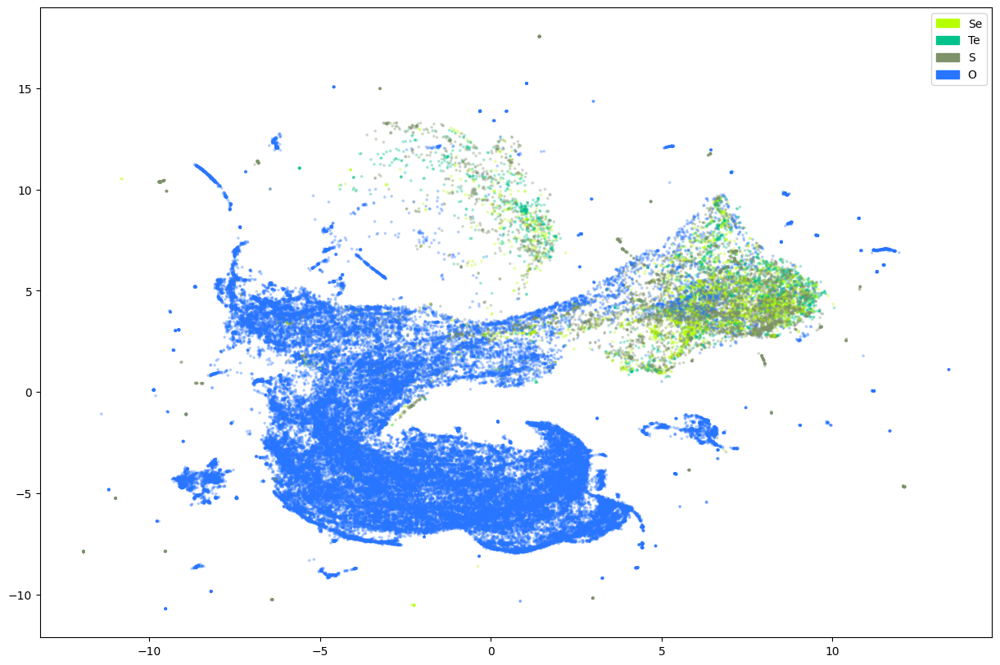

In [137]:
analyze_subsection(sixth_col, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


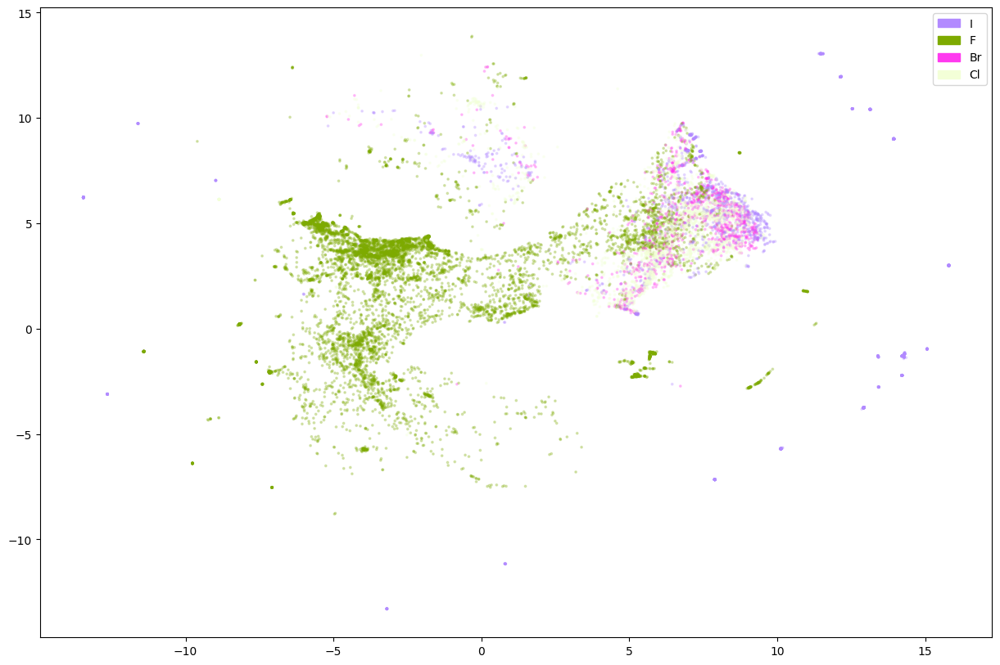

In [138]:
analyze_subsection(seventh_col, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

## Row Plots

### Not Retransformed

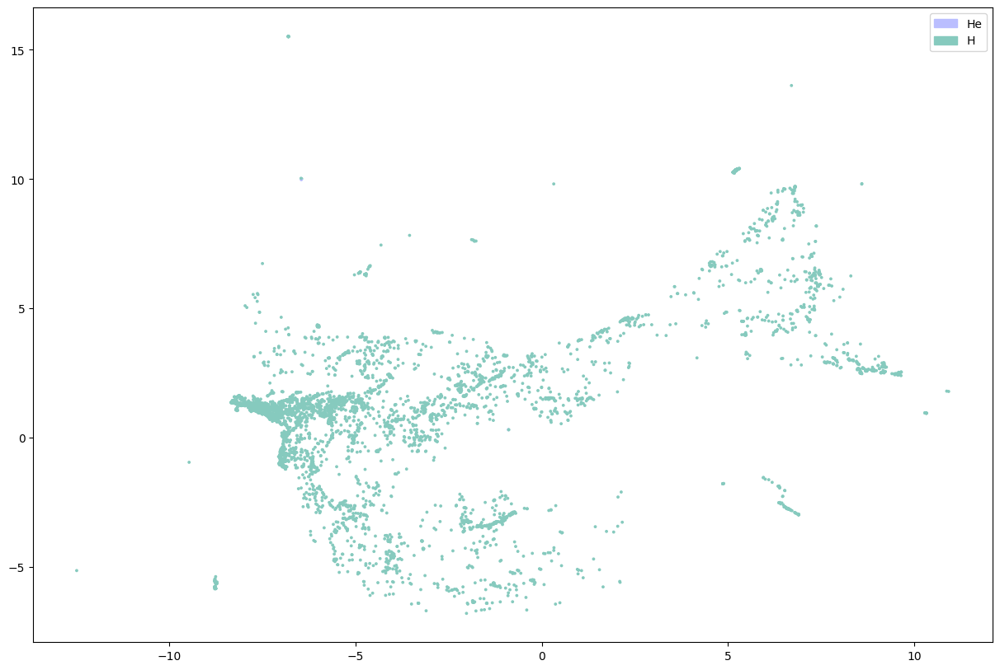

In [114]:
row1 = ['H','He']

make_elemental_plot(row1, embedding, colors, color_subset, el_subset, elemental_files)

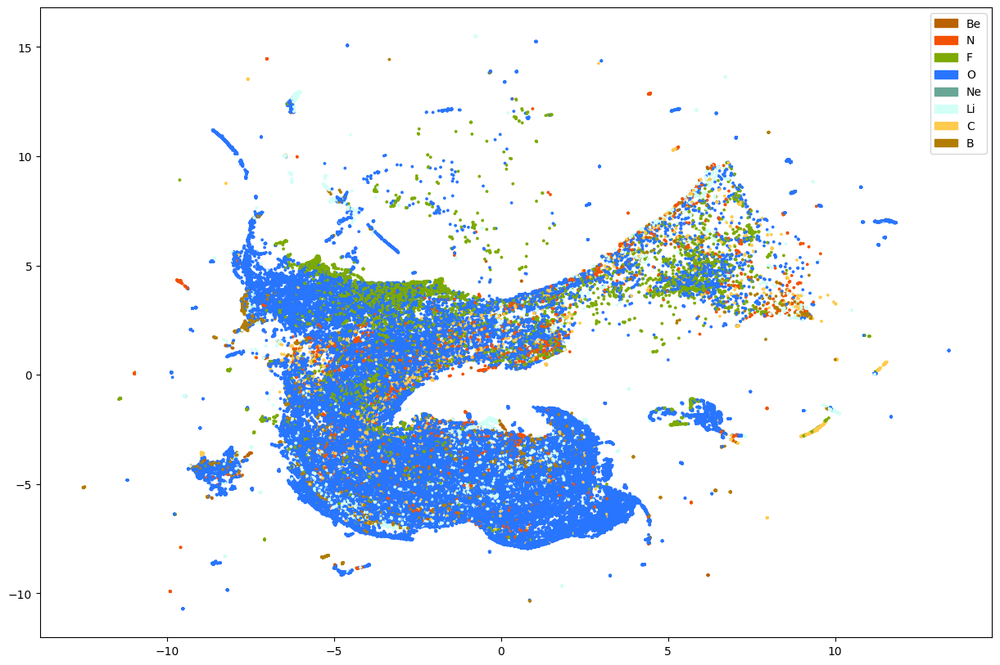

In [115]:
row2 = ['Li','Be','B','C','N','O','F','Ne']

make_elemental_plot(row2, embedding, colors, color_subset, el_subset, elemental_files)

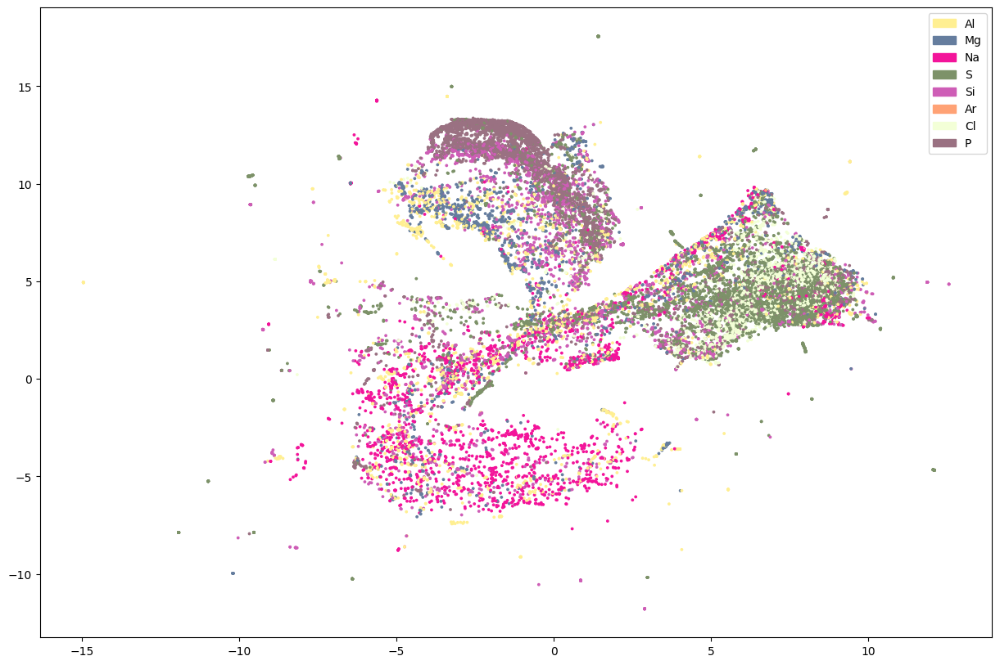

In [116]:
row3 = ['Na','Mg','Al','Si','P','S','Cl','Ar']

make_elemental_plot(row3, embedding, colors, color_subset, el_subset, elemental_files)

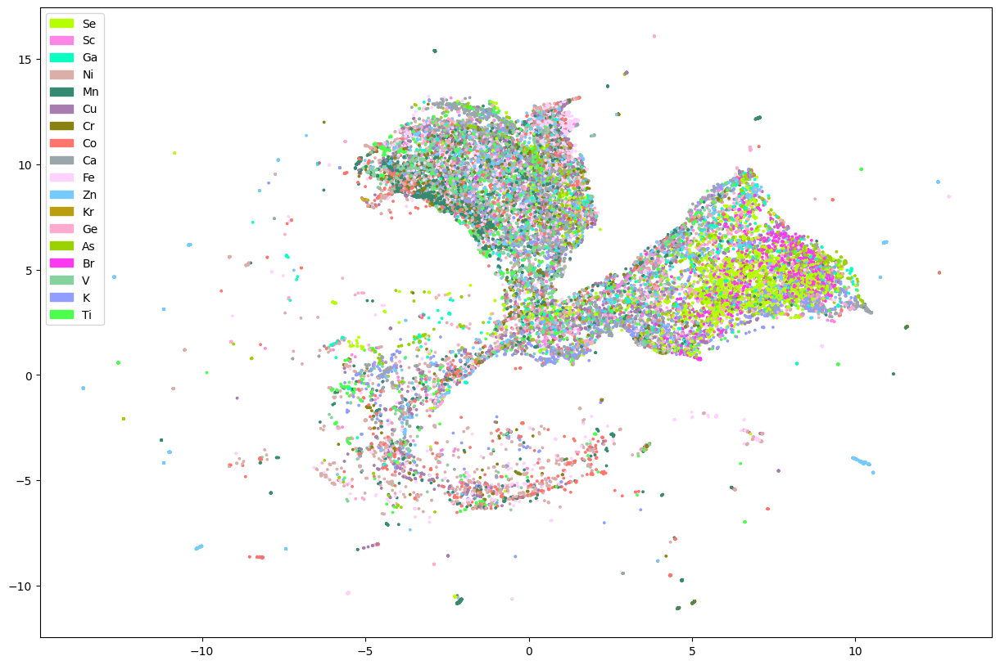

In [117]:
row4 = ['K','Ca','Sc','Ti','V','Cr','Mn','Fe','Co','Ni','Cu','Zn','Ga','Ge','As','Se','Br','Kr']

make_elemental_plot(row4, embedding, colors, color_subset, el_subset, elemental_files)

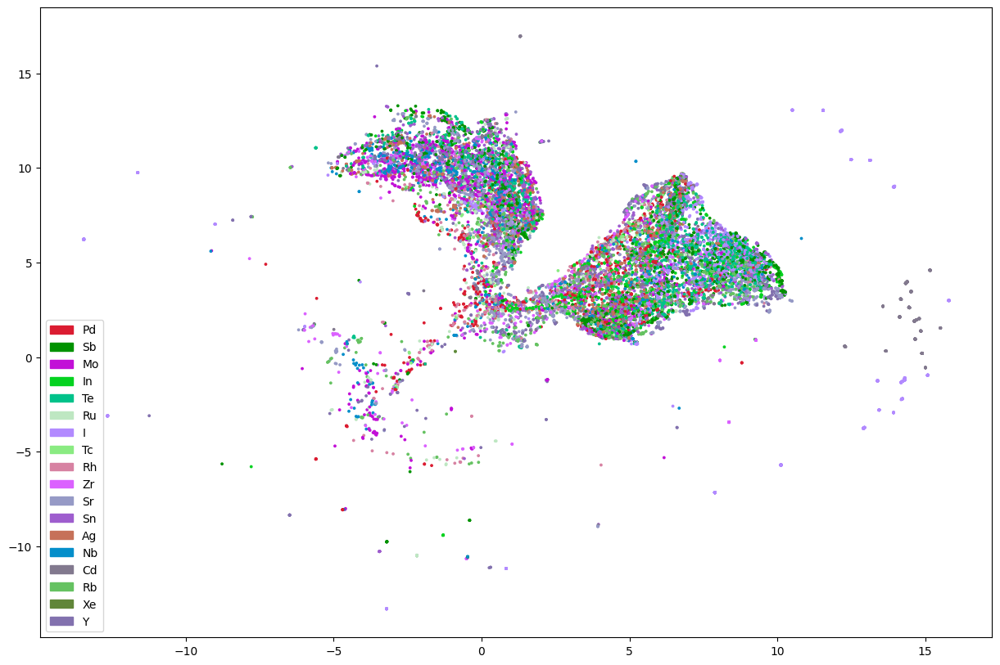

In [118]:
row5 = ['Rb','Sr','Y','Zr','Nb','Mo','Tc','Ru','Rh','Pd','Ag','Cd','In','Sn','Sb','Te','I','Xe']

make_elemental_plot(row5, embedding, colors, color_subset, el_subset, elemental_files)

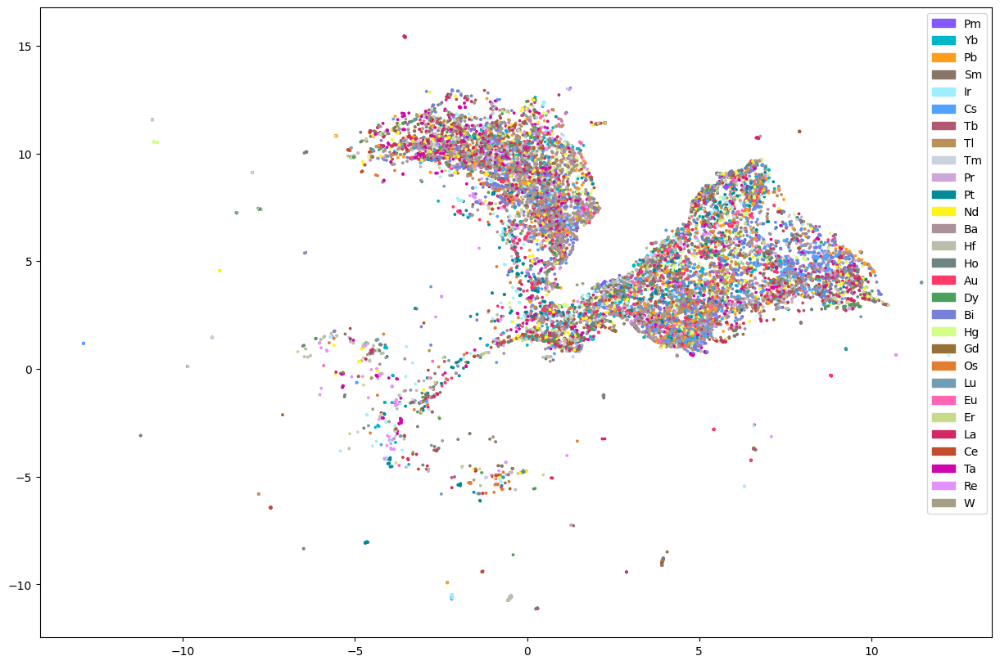

In [119]:
row6 = ['Cs','Ba','La','Ce','Pr','Nd','Pm','Sm','Eu','Gd','Tb','Dy','Ho','Er','Tm','Yb','Lu','Hf',
                    'Ta','W','Re','Os','Ir','Pt','Au','Hg','Tl','Pb','Bi','Po','At','Rn']

make_elemental_plot(row6, embedding, colors, color_subset, el_subset, elemental_files)

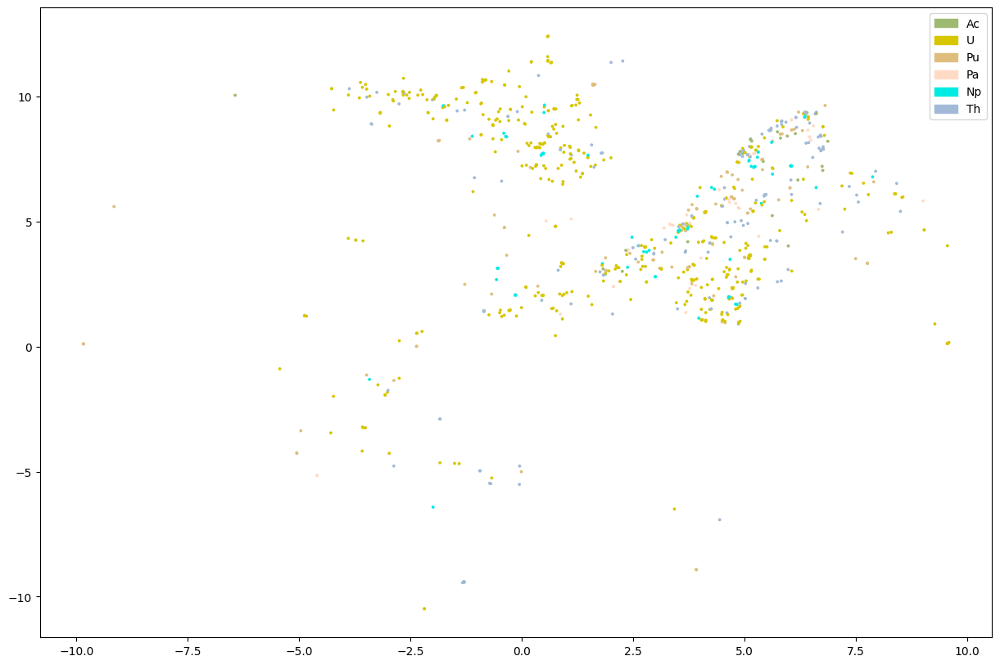

In [120]:
row7 = ['Fr','Ra','Ac','Th','Pa','U','Np','Pu','Am','Cm','Bk','Cf','Es','Fm','Md','No','Lr','Rf',
                    'Db','Sg','Bh','Hs','Mt','Ds','Rg','Cn','Nh','Fl','Mc','Lv','Ts','Og']

make_elemental_plot(row7, embedding, colors, color_subset, el_subset, elemental_files)

### Retransformed

Epochs completed:   0%|            0/100 [00:00]

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


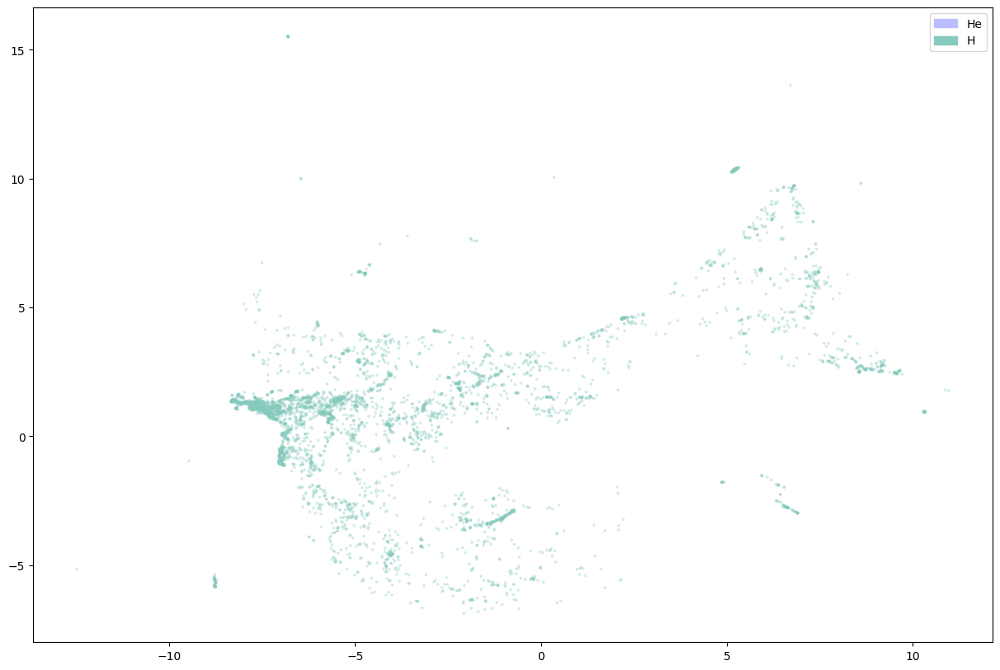

In [139]:
analyze_subsection(row1, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


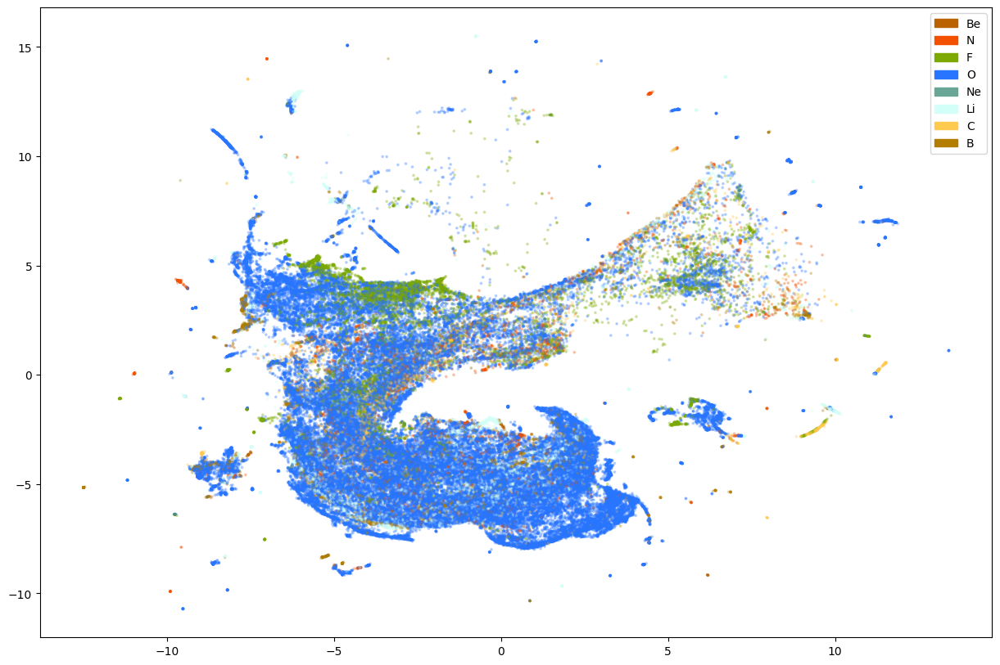

In [140]:
analyze_subsection(row2, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


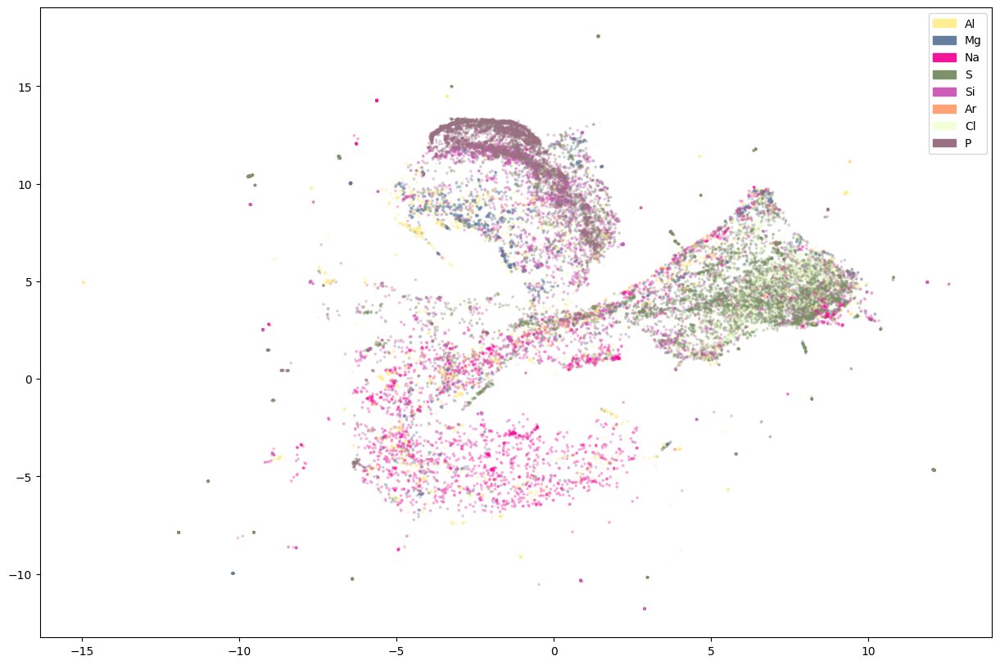

In [141]:
analyze_subsection(row3, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


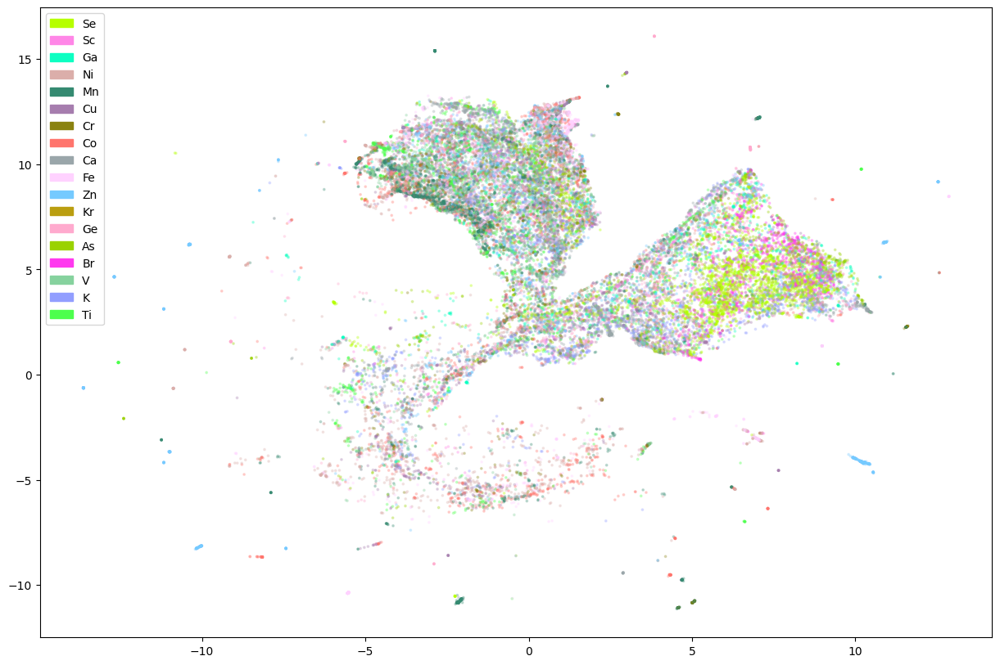

In [143]:
analyze_subsection(row4, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


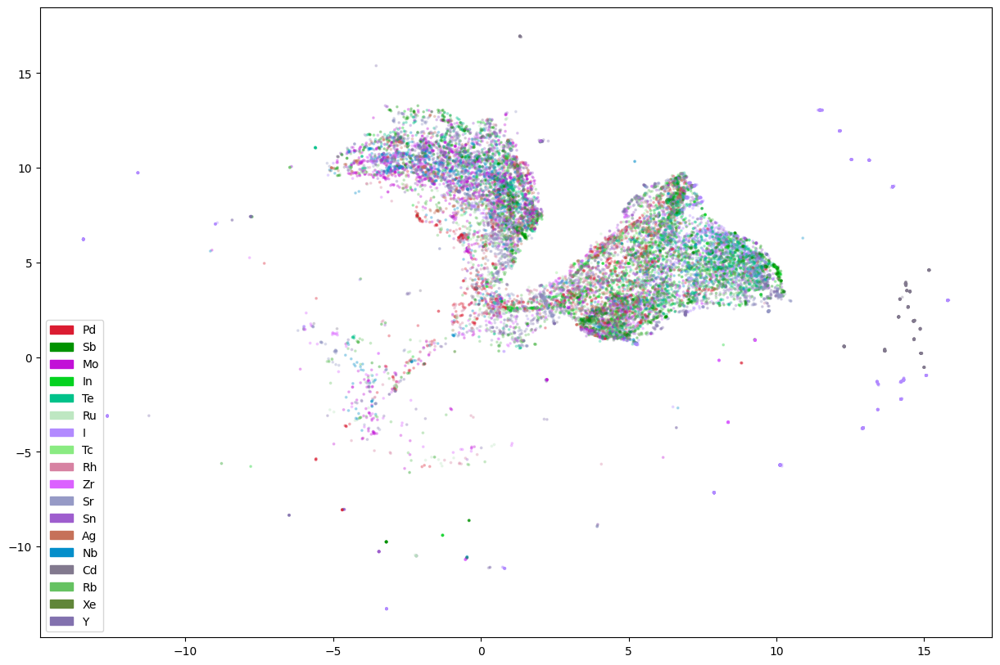

In [144]:
analyze_subsection(row5, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/30 [00:00]

	completed  0  /  30 epochs
	completed  3  /  30 epochs
	completed  6  /  30 epochs
	completed  9  /  30 epochs
	completed  12  /  30 epochs
	completed  15  /  30 epochs
	completed  18  /  30 epochs
	completed  21  /  30 epochs
	completed  24  /  30 epochs
	completed  27  /  30 epochs


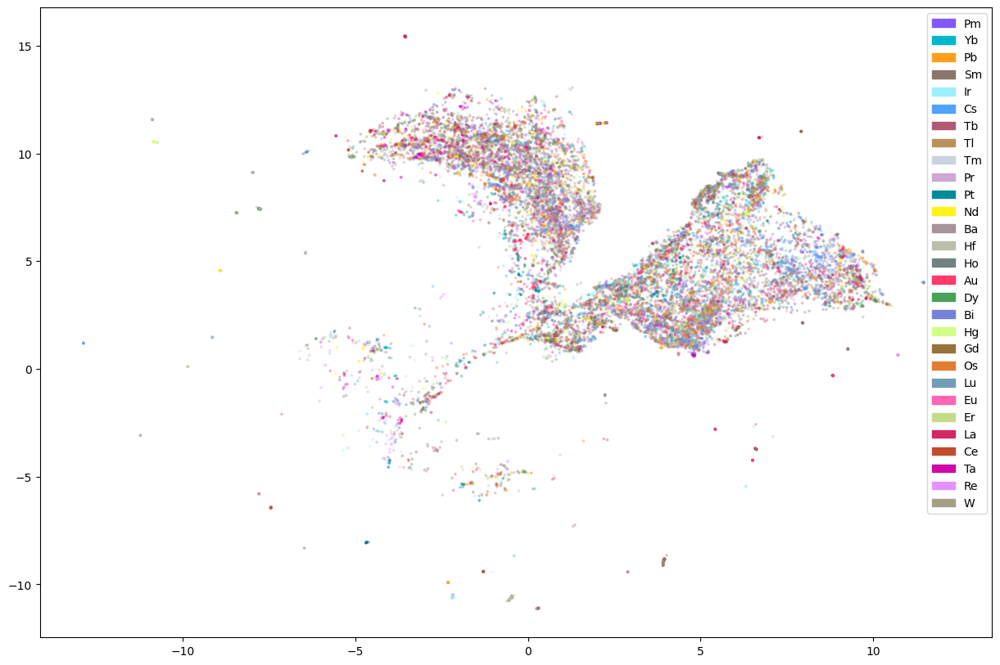

In [145]:
analyze_subsection(row6, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)

Epochs completed:   0%|            0/100 [00:00]

	completed  0  /  100 epochs
	completed  10  /  100 epochs
	completed  20  /  100 epochs
	completed  30  /  100 epochs
	completed  40  /  100 epochs
	completed  50  /  100 epochs
	completed  60  /  100 epochs
	completed  70  /  100 epochs
	completed  80  /  100 epochs
	completed  90  /  100 epochs


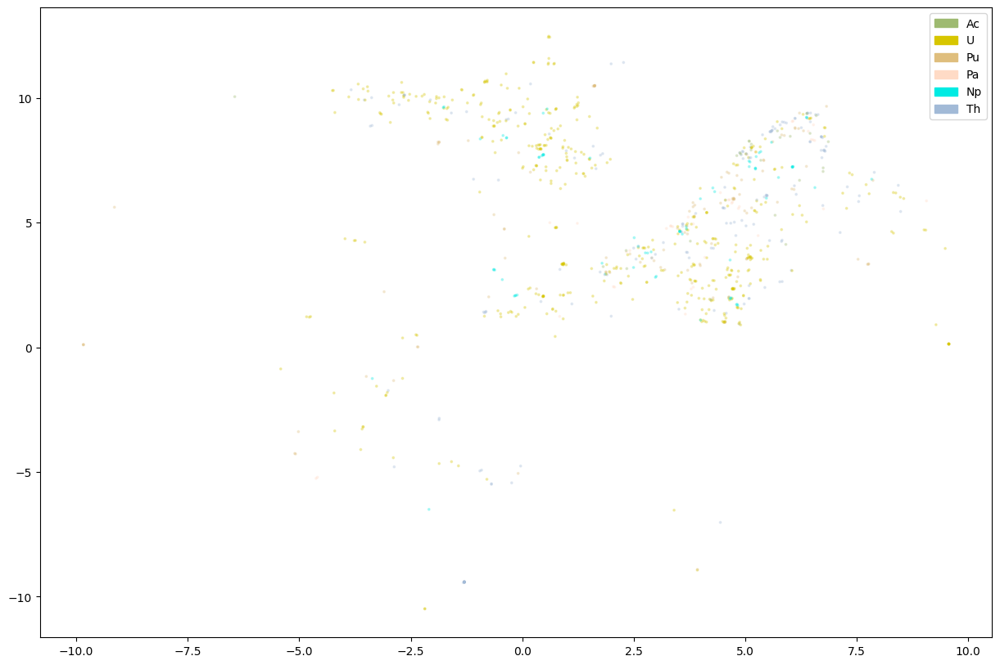

In [146]:
analyze_subsection(row7, subset, colors, el_subset, color_subset, elemental_files, reducer, alpha = 0.25, size = 3)